# Experiments with MNIST networks

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.pylabtools import figsize

import seaborn as sns
import plotly.express as px

import numpy as np
import pandas as pd
import polars as pl

import statsmodels.formula.api as smf

import torch

## First, let's just fit complex CGFs for MNIST

This task does not have any positive values for distribution changes.

In [2]:
%run models/simple_examples.py
from trainers import train_model

In [3]:
mnist_model = Basic_MNIST()
train_model(mnist_model, None)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type             | Params | Mode 
----------------------------------------------------
0 | model  | Sequential       | 22.3 K | train
1 | lossFn | CrossEntropyLoss | 0      | train
----------------------------------------------------
22.3 K    Trainable params
0         Non-trainable params
22.3 K    Total params
0.089     Total estimated model params size (MB)
5         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▄▂▂▂▂▁▂▁▁▁▁▁▁▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▅▄▃▂▂▂▁▂▁▂▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅
Val acc,▁▄▅▆▆▇▇▇▇████▇████████▇██▇▇▇█▇▇███▇██▇▇▇
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇██
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇████
Train Loss,0.00083
Val Loss,0.20781
Val acc,0.9625
epoch,54
trainer/global_step,92839


'./learnedExpFam/s7w8r2zh/checkpoints/epoch=54-step=92840.ckpt'

In [4]:
activity_data = mnist_model.internal_activity_dataset(mnist_model.data_train)

In [5]:
from icnn import CGF_ICNN

In [6]:
cgf_net = CGF_ICNN(activity_data[:][0], hidden_size=1000, numsamples=50000)

In [7]:
train_model(cgf_net, 'trainedParameters/MNIST_initial')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model params size (

Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▅▄▃▂▂▂▂▂▂▃▂▂▂▂▁▁▂▂▂▂▁▂▂▂▁▂▁▁▁▂▂▁▂▁▁▂▂▂▁
Val Loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█
trainer/global_step,▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇███
Train Loss,242.46136
Val Loss,382.13065
epoch,810
trainer/global_step,253842


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/validation-epoch=710-step=222543.ckpt'

## Gotta debug the neural networks again

### Lesson 1: whitening the data is importance for reducing the total size of the CDF outputs, which the function can struggle to fit

In [97]:
pca = PCA(whiten=True)

# Fit and transform the data
X_whitened = pca.fit_transform(activity_data[:][0])

X_whitened = torch.as_tensor(X_whitened, dtype=torch.float32)

In [98]:
cgf_net = CGF_ICNN(activity_data[:][0], hidden_size=1000, numsamples=50000)
cgf_net.empirical_CGF(torch.randn(200, 28))

tensor([ 48.8666,  49.1202,  47.2331,  68.1877,  22.9234,  64.2005, 108.8309,
         87.5730,  32.4888,  39.9366,   9.9873,  24.8854,  82.1574,  38.4951,
         82.0097,  62.3813,  66.6039,  61.0093,  74.1328,  85.9725,  86.5632,
         59.4182,  64.8435,  45.5247, 114.7992,  54.4029, 112.7473,  73.8579,
         70.9573,  92.2528, 109.2768, 112.8449,  62.6745,  92.4120, 128.0925,
        113.0849,  95.8181,  58.5427,  64.8319, 122.6911,  95.8983,  56.9729,
         99.0699,  46.9921,  42.8604,  50.6206,  61.7062,  91.3498,  29.4500,
         70.3397,  39.8327,  68.8309,  83.5209,  63.9187, 100.9458,  67.9328,
         42.0488,  94.8302,  40.3222,  96.7651, 158.5840,  21.6227, 117.9435,
         57.9359, 117.1153,  77.5969,  53.6373,  47.8850,  49.9172,  86.9295,
        113.2732,  99.3903,  65.5063,  63.4723, 111.1518,  47.6767,  88.9379,
         93.1056,  83.5023, 101.1973,  46.1620,  46.4542,  69.5145,  41.7685,
         79.5865,  82.7057, 117.0967,  84.1517,  30.1906,  60.54

In [99]:
cgf_net = CGF_ICNN(X_whitened, hidden_size=1000, numsamples=50000)
cgf_net.empirical_CGF(torch.randn(200, 28))

tensor([18.2921,  6.2127, 13.9096, 17.2909,  9.3191, 15.4268, 13.0945, 20.0616,
        12.4222, 26.4001, 14.7179, 17.1146, 23.4100, 14.9468, 15.5726, 25.8237,
         9.9252, 15.2647, 11.8508, 15.0912, 11.4980, 20.0562, 22.7387, 11.5911,
        22.4624, 12.9600, 18.9611, 10.4994, 12.0528, 14.4155,  9.0836, 15.3207,
        17.1744, 12.4943, 10.2003, 16.6060, 15.2487, 16.2513, 11.9390, 15.9217,
         9.3944,  9.0447, 11.2710, 12.6885, 20.7181, 14.1612, 15.9852, 17.0456,
        10.2728, 16.8841, 19.5987, 12.2119,  8.5374, 16.2237, 13.7815, 12.3592,
        16.9316, 13.6934, 26.5049, 12.4922, 10.2399, 14.4834, 12.6187,  9.8674,
        11.8950, 17.5154, 13.2662, 14.3119, 23.3103, 27.0884, 19.2477, 19.6836,
         9.1488, 16.6111, 16.8715, 16.3890, 18.8890, 21.6450, 19.7290, 22.0311,
        15.6103,  6.8631, 13.5053, 10.5143,  5.4984, 12.4040, 15.5238,  8.9709,
         8.5324, 11.5131,  6.7164, 11.4892, 16.7249, 14.2377, 12.6669,  7.5938,
        17.6659, 22.1475, 17.5111,  9.99

In [100]:
cgf_net = CGF_ICNN(torch.randn(10000, 28), hidden_size=1000, numsamples=50000)
cgf_net.empirical_CGF(torch.randn(200, 28))

tensor([16.1462, 11.6470, 12.2243, 15.3602, 14.9020,  8.8003, 10.5687, 10.6837,
        11.1205,  9.2901, 12.2216, 15.0134, 14.3539, 15.0286, 12.2244, 11.8292,
         9.5358,  9.3868, 10.4116,  7.1553, 12.2361,  9.3521, 16.6472,  5.1004,
        13.2413,  9.3409, 11.9125, 12.9888, 12.3824, 12.7764, 11.9777,  8.8862,
        10.8192, 15.1003,  9.7916, 10.1678, 12.5036, 12.2617, 14.9274, 16.0516,
        16.8039, 11.5044, 11.9345,  8.3876, 11.3222, 11.4635, 14.7703, 16.3381,
         9.1383,  8.3083, 11.0178, 12.1589, 14.5792, 16.1755, 10.8337, 17.3029,
         7.4304,  9.0588, 11.1011, 17.9744, 11.9954,  8.6272,  8.5555,  8.2609,
        14.7453, 10.3991, 17.9633, 12.6555, 15.2224, 11.1178,  9.2149,  9.4964,
        10.4952, 16.3567, 15.7018, 15.2073, 10.6714, 10.1490, 12.9030, 10.4306,
        12.3866, 17.5623, 10.5295, 11.9415, 10.1184, 13.8405,  5.5866, 11.3482,
        12.5299, 14.6718, 11.6317, 12.6962, 16.8712, 15.6877,  8.5175,  8.6779,
        15.0452, 11.4538, 12.7135, 10.00

In [102]:
cgf_net.forward(torch.randn(200, 28)).T

tensor([[-1.9600, -1.8962, -1.9204, -1.9465, -1.9128, -1.9156, -1.9444, -1.8965,
         -1.9322, -1.9445, -1.9274, -1.9154, -1.9208, -1.9243, -1.9263, -1.9233,
         -1.9207, -1.9480, -1.9489, -1.9416, -1.9266, -1.9339, -1.9482, -1.9419,
         -1.9240, -1.9322, -1.9202, -1.9535, -1.9411, -1.9289, -1.9234, -1.9204,
         -1.9128, -1.9313, -1.9345, -1.8923, -1.8836, -1.9324, -1.9097, -1.9256,
         -1.9323, -1.9483, -1.9405, -1.9301, -1.9043, -1.9324, -1.9210, -1.9163,
         -1.9083, -1.9436, -1.9307, -1.8924, -1.9325, -1.9255, -1.9265, -1.9348,
         -1.8947, -1.9278, -1.9124, -1.9197, -1.9469, -1.8969, -1.9248, -1.9331,
         -1.9293, -1.9427, -1.9259, -1.9466, -1.8990, -1.9023, -1.9263, -1.9289,
         -1.9189, -1.9003, -1.9385, -1.9114, -1.9290, -1.9237, -1.9369, -1.9348,
         -1.9353, -1.9232, -1.9125, -1.9164, -1.9440, -1.9397, -1.9326, -1.9403,
         -1.9101, -1.9296, -1.9451, -1.9352, -1.9285, -1.9318, -1.9201, -1.9105,
         -1.9231, -1.9191, -

Note that the unwhitened targets are large, while the untrained network outputs small values.

Whitening gets us back in the domain of normal data. Is that enough?

In [108]:
cgf_net = CGF_ICNN(torch.randn(10000, 28), hidden_size=1000, numsamples=50000)

In [109]:
train_model(cgf_net, 'trainedParameters/MNIST_initial/random_data')

Train Loss,█▅▆▄▃▃▃▅▃▂▂▃▄▃▂▂▃▃▃▃▃▁▂▁▂▃▃▂▂▂▂▃▃▂▁▃▂▁▂▂
Val Loss,█▄▃▂▂▂▂▁▂▁▂▁▁▁▁▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇███
Train Loss,56.07045
Val Loss,60.8442
epoch,41
trainer/global_step,12839


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/random_data exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model p

Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,▇█▄▅▅▃▄▅▃▇▅▃▃▅▅▃▃▇▃▂▁▄▂▃▅▂▄▄▃▃▆▄▁▂▃▂▅▄▁▂
Val Loss,▅▇▆▅▄█▄▃▃▄▄▄▃▃▃▂▃▃▃▂▆▂▂▂▂▁▂▂▂▁▁▂▁▂▂▂▁▁▂▁
epoch,▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇██
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇███
Train Loss,40.35189
Val Loss,53.23993
epoch,930
trainer/global_step,291402


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/random_data/validation-epoch=830-step=260103.ckpt'

Certainly a better start. Across multiple parameter values, the initial error _is_ much lower.

However, this is not enough to allow the network to learn fully. Why does the stimulus dimsionality impact the initial outputs at all?

### What is the difference to the low dimensionaly case?

In [150]:
lowdim = CGF_ICNN(torch.randn(1000, 2))
highdim = CGF_ICNN(torch.randn(1000, 28))

Text(0.5, 1.0, 'low dimensional outputs')

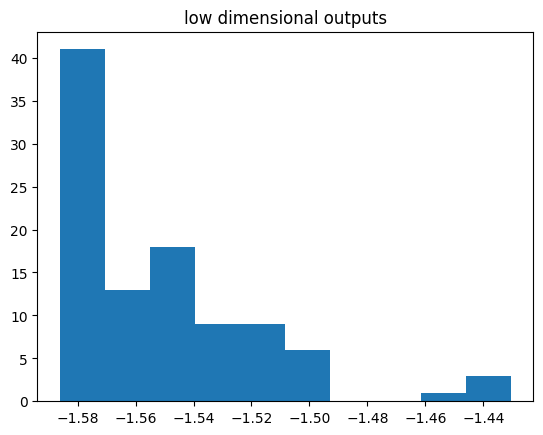

In [127]:
plt.hist(lowdim.forward(torch.randn(100,2)).squeeze().detach())
plt.title('low dimensional outputs')

Text(0.5, 1.0, 'low dimensional targets')

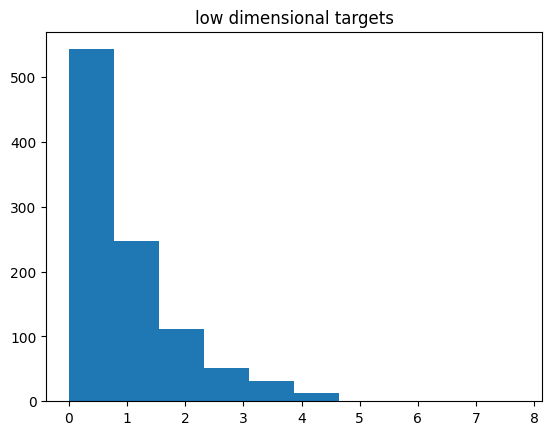

In [130]:
plt.hist(lowdim.empirical_CGF(torch.randn(1000, 2)))
plt.title('low dimensional targets')

Text(0.5, 1.0, 'high dimensional outputs')

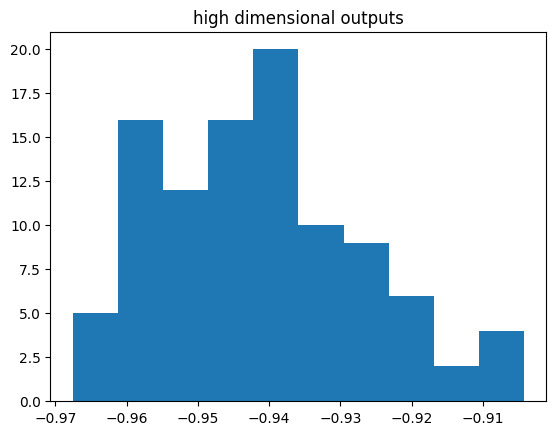

In [128]:
plt.hist(highdim.forward(torch.randn(100,28)).squeeze().detach())
plt.title('high dimensional outputs')

Text(0.5, 1.0, 'high dimensional targets')

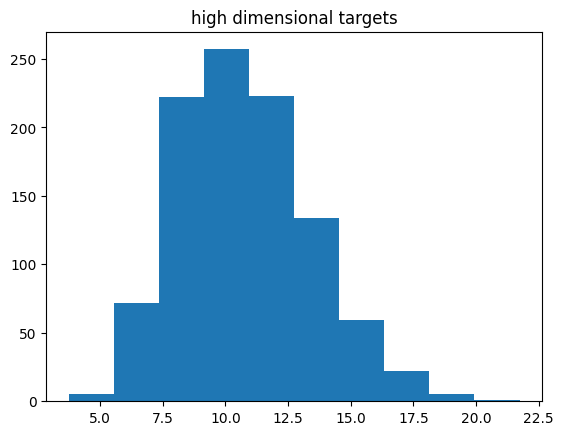

In [131]:
plt.hist(highdim.empirical_CGF(torch.randn(1000, 28)))
plt.title('high dimensional targets')

This seems to be the main difference: where the target cgf peaks at outputs that are an order of magnitude larger than the default network outputs, which remain relatively similar between the low and high dimensional cases

### What if we just brute-force multiply the outputs to make them more similar?

In [147]:
list(highdim.model[6].parameters())[0].data = list(highdim.model[6].parameters())[0].data*10


Text(0.5, 1.0, 'high dimensional outputs')

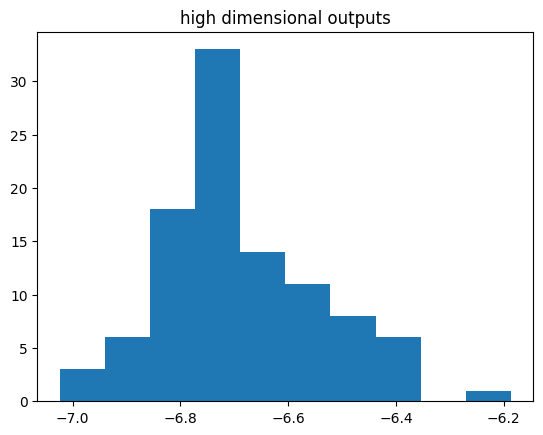

In [148]:
plt.hist(highdim.forward(torch.randn(100,28)).squeeze().detach())
plt.title('high dimensional outputs')

In [149]:
train_model(highdim, 'trainedParameters/MNIST_initial/reinitialize')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                     | 0/? […

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                            | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Train Loss,█▃▃▂▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇███
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
Train Loss,17.19616
Val Loss,79.80518
epoch,384
trainer/global_step,5004


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize/validation-epoch=284-step=3705.ckpt'

No joy. It is completely the wrong sign though...

#### What about shifting the bias?

In [158]:
highdim = CGF_ICNN(torch.randn(1000, 28), numsamples=20000, )
list(highdim.model[6].parameters())[1].data = list(highdim.model[6].parameters())[1].data + 10


Text(0.5, 1.0, 'high dimensional outputs')

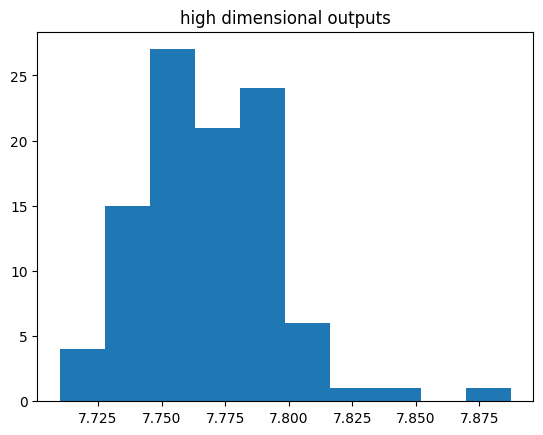

In [159]:
plt.hist(highdim.forward(torch.randn(100,28)).squeeze().detach())
plt.title('high dimensional outputs')

In [160]:
train_model(highdim, 'trainedParameters/MNIST_initial/reinitialize')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model 

Sanity Checking: |                                                                                     | 0/? […

Training: |                                                                                            | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Yep, still no joy.

#### Both?

In [161]:
highdim = CGF_ICNN(torch.randn(1000, 28), numsamples=20000, )
list(highdim.model[6].parameters())[0].data = list(highdim.model[6].parameters())[0].data * 10
list(highdim.model[6].parameters())[1].data = list(highdim.model[6].parameters())[1].data + 10


Text(0.5, 1.0, 'high dimensional outputs')

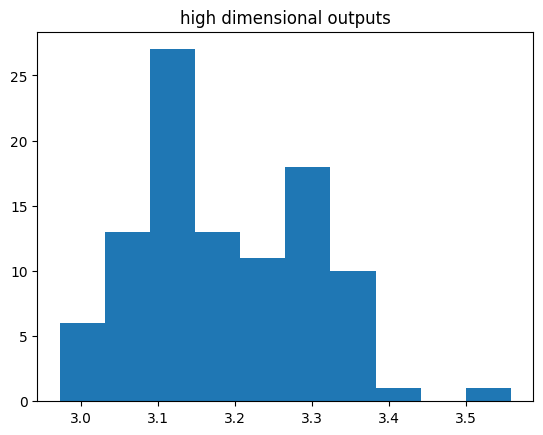

In [162]:
plt.hist(highdim.forward(torch.randn(100,28)).squeeze().detach())
plt.title('high dimensional outputs')

In [163]:
train_model(highdim, 'trainedParameters/MNIST_initial/reinitialize')

Train Loss,█▇▆▅▅▄▄▃▄▂▅▁▃▅▃▄▂▃▄▃▄▄▃▄▃▃▄▄▄▄▂▂▂▃▂▃▃▂▂▃
Val Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇██
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇████
Train Loss,52.27001
Val Loss,61.5122
epoch,132
trainer/global_step,16559


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model 

Sanity Checking: |                                                                                     | 0/? […

Training: |                                                                                            | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Nope.

In [165]:
a = torch.randn(100, 28)
highdim.forward(a).T

tensor([[17.8063, 19.2265, 17.7278, 21.2181, 17.4953, 16.3832, 18.7919, 17.4303,
         18.4963, 19.4502, 17.7205, 19.7347, 19.0759, 16.8876, 18.2837, 17.5033,
         17.6585, 19.2640, 17.9063, 17.3727, 19.6473, 18.2811, 19.0121, 18.2704,
         19.1406, 16.5495, 20.8053, 20.2725, 17.3943, 18.7419, 19.9493, 17.3290,
         17.5891, 17.8094, 18.1407, 18.1906, 17.4316, 18.0209, 18.1976, 18.4906,
         17.8700, 19.2981, 16.6655, 18.0171, 18.3702, 21.8561, 17.8062, 19.1986,
         16.8340, 19.4116, 17.2729, 17.9308, 16.9563, 18.0294, 20.4671, 21.3733,
         18.9927, 18.2322, 18.0342, 18.1915, 20.3600, 17.0334, 18.4833, 18.4729,
         16.0329, 16.7085, 18.6167, 18.6276, 18.5028, 17.8107, 17.5979, 19.1138,
         18.0792, 19.0708, 20.0672, 18.6873, 17.5228, 19.9030, 15.8608, 19.4638,
         20.0296, 19.6808, 18.3958, 18.5896, 19.6671, 17.6232, 17.6076, 19.4737,
         21.6282, 18.4426, 20.8379, 17.1364, 19.4169, 18.1699, 17.2149, 17.4442,
         20.0013, 18.2367, 2

In [166]:
highdim.empirical_CGF(a)

tensor([ 9.5229, 12.5786,  7.5648, 14.7600,  9.2526, 10.0849, 10.4895,  8.7681,
         9.4589, 10.2663, 12.6028, 11.6934, 10.8301,  7.9253,  8.4956,  9.8646,
         9.3581, 11.1154, 12.9134,  8.4219, 10.5210, 14.8924, 10.3058, 10.1849,
        15.7430,  6.8633, 14.2037, 16.0636,  8.1260, 10.4699, 12.6119,  8.0443,
         8.4221, 10.0265, 11.4516,  9.0712, 12.9830, 10.6195, 12.5516,  9.5018,
        10.5390, 10.1232,  7.3434, 11.3207,  8.2324, 13.0980,  9.5579, 12.4737,
         8.3917, 15.0712,  8.4265, 12.0428,  7.7477,  9.9766, 14.2380, 13.2246,
        14.9083, 10.5901,  9.2891,  9.7478,  9.6058,  9.6548, 11.9797, 10.0873,
         8.5223,  8.2011, 10.3301, 14.7476, 13.8664, 11.0881,  8.7281,  9.7240,
        10.0673,  9.9700, 11.6891, 10.0420,  8.4953, 14.5459,  6.3509,  8.8799,
        11.5545, 14.1459, 12.0239,  7.7071, 12.2977, 12.1024, 11.7853, 10.6748,
        14.1448, 16.3900, 15.0571,  6.9954, 11.1007,  9.1109,  7.7602,  8.1273,
        11.3591, 10.4055, 12.7077,  6.96

In [167]:
highdim = CGF_ICNN(torch.randn(1000, 28), hidden_size=1000, numsamples=20000, )
list(highdim.model[6].parameters())[0].data = list(highdim.model[6].parameters())[0].data * 10
list(highdim.model[6].parameters())[1].data = list(highdim.model[6].parameters())[1].data + 10

In [168]:
train_model(highdim, 'trainedParameters/MNIST_initial/reinitialize')

Train Loss,▆█▄▄▄▄▆▃▆▅▅▃▅▁▄▄▅▃▄▅▃▄▅▂▄▃▂▂▃▄▄▃▁▄▃▃▂▄▃▂
Val Loss,█▄▂▂▂▂▃▂▂▂▁▂▂▁▂▂▁▁▁▂▂▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▂▂▂▁
epoch,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█████
trainer/global_step,▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
Train Loss,53.37821
Val Loss,56.63332
epoch,234
trainer/global_step,29309


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model 

Sanity Checking: |                                                                                     | 0/? […

Training: |                                                                                            | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Train Loss,█▇▆▅▅▃▄▄▄▆▄▅▅▃▃▄▃▂▄▄▃▃▂▁▂▂▂▁▂▂▁▂▂▂▂▂▂▂▂▄
Val Loss,█▆▆▇▅▄▅▅▅▅▅▄▅▅▄▅▄▄▃▃▂▃▃▂▁▃▂▂▂▃▂▃▂▃▃▃▂▃▃▄
epoch,▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇███
trainer/global_step,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
Train Loss,50.93205
Val Loss,67.13487
epoch,240
trainer/global_step,30124


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize/validation-epoch=140-step=17625.ckpt'

In [169]:
a = torch.randn(100, 28)
highdim.forward(a).T

tensor([[27.0186, 27.2849, 27.2830, 26.1444, 28.4934, 26.6131, 26.7659, 27.9173,
         25.3676, 28.3666, 27.4240, 29.6247, 28.0104, 27.5584, 26.5462, 26.4256,
         25.9237, 28.8769, 27.1102, 28.7378, 26.5186, 27.9041, 26.0609, 26.5848,
         27.9290, 25.7370, 26.0543, 29.1042, 26.7589, 26.6868, 28.4645, 26.7024,
         26.4688, 26.2101, 25.5596, 29.6276, 27.7121, 28.2355, 27.3236, 25.4296,
         29.4737, 27.2550, 27.7851, 26.1590, 27.7754, 28.5657, 26.6354, 29.4283,
         24.9713, 26.3016, 29.2768, 26.5538, 26.1973, 25.9673, 26.6057, 28.5589,
         27.6420, 27.4792, 28.6570, 25.3609, 26.8524, 26.1348, 25.8562, 26.0126,
         27.1904, 26.4230, 25.3156, 29.3882, 28.8120, 26.9272, 29.8875, 25.1497,
         26.9774, 25.9973, 25.0374, 27.2255, 27.7647, 25.8950, 28.0853, 29.1497,
         26.5703, 26.6245, 26.8188, 27.9636, 27.2199, 27.9647, 27.5235, 26.6536,
         26.5511, 29.1408, 27.6357, 26.3513, 27.8796, 24.9477, 27.7875, 27.0667,
         27.0505, 26.6726, 2

In [170]:
highdim.empirical_CGF(a)

tensor([12.7013, 12.8736, 13.8076,  9.3803, 12.4502,  8.7853, 11.7154, 12.7052,
         8.3650, 11.6801,  9.0208, 19.5663, 12.8527, 11.2856,  9.4344, 12.7738,
         9.7956, 14.9108, 12.1580, 10.7870,  9.7065, 12.1620,  7.8100,  8.9589,
        12.0172,  7.7064, 11.4450, 12.9522,  8.1240,  8.4132, 14.0619,  9.7494,
        10.5302, 13.1053,  9.8700, 15.6559, 12.0845, 14.9550,  8.8323,  6.8991,
        16.3976,  8.1663,  8.1584,  8.0088, 12.6441, 10.5491, 13.9250, 15.9392,
         4.6986,  8.7738, 12.9079, 13.0972,  9.0388,  8.3304,  9.3155, 11.8646,
        13.3158, 13.1939, 11.8596,  8.1774,  9.5903,  7.9793,  9.6052,  8.2894,
         9.2580,  9.2305,  6.2505, 16.1110, 12.7989, 12.3849, 14.3982,  9.4790,
         9.8205,  9.4984,  5.7827, 13.8743, 14.0998,  8.7858, 13.8945, 15.4115,
         9.6422, 10.9531, 10.9931, 14.2663,  9.8123, 12.4634, 10.8544, 11.6098,
         9.5986, 17.0183, 11.1574, 11.9867, 12.0022,  7.5085, 12.3973, 10.1973,
         9.9849,  9.0899, 14.4074,  9.16

No real change from making the network bigger. The order of magnitude is right, but the spread of the outputs seems too low 

In [174]:
(highdim.model[0:5](a)>0).sum()

tensor(11055)

In [177]:
highdim.model[0:5](a).shape

torch.Size([100, 1000])

There are positive values, but they're sparse

In [187]:
(highdim.model[0:5](a)>0).sum(0)

tensor([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   8,
          0,   0,   0,  92,   0,   0,   0,   0,   0,   0,   0,   0,   0, 100,
          0,   0,   0,   0,   0,   0,   0,   0,  83,   0,   0,   0,   0,   3,
          0,   0,   0,   0,  35,   0,   0,   0,   0,  17,   0,   1,  50,   0,
          0,  11,   0,   0,   0,   0,   0,   0,  72,   0,   3, 100,   0,   0,
          0,  13, 100, 100,   1,   0,   0,   0,   0,  45,   0,   0,   0,   0,
          0,   0,   0,   4,   0, 100, 100,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   2,   0,   0,   0,   0,  33,   0,   0,   0,   8,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  44,   0,   0,   0,
        100,  12,   0,   0,  11,  11,   0, 100,   0,   2,   0, 100,   0,   0,
          0,   0,   0,   1,   0,  20,   0,   0,   0,   0, 100,   0,   0,  29,
          0,   0,   0, 100,   0,   0,   0,   0,   0,   0, 100,   0,   0, 100,
          0,   9,   0,   0,   0,   0,   0,   0,   0,   0,   0,  

There does seem to be quite a lot of 'unused' dimensions, in that they are negative for all inputs. Many 'used' dimensions are positive for all inputs too.

~200 dimensions have positive values

In [193]:
highdim.model[0:5](a).var(0)

tensor([1.3790e-03, 2.0034e-03, 7.0084e-03, 4.3492e-02, 2.5730e-02, 6.7685e-04,
        5.4048e-02, 4.2555e-02, 1.0041e-03, 2.1000e-04, 4.7647e-02, 3.9734e-04,
        4.8402e-02, 5.6019e-02, 1.5351e-03, 4.6779e-03, 5.7141e-02, 1.6746e-03,
        9.6935e-04, 1.1493e-03, 1.1298e-02, 3.4667e-03, 1.7824e-02, 1.3929e-03,
        2.4891e-03, 2.5017e-04, 4.0603e-02, 0.0000e+00, 7.5811e-03, 1.0074e-03,
        2.5855e-03, 5.5991e-02, 2.0268e-03, 5.3947e-04, 7.4040e-04, 4.9540e-02,
        1.1482e-03, 9.1517e-04, 5.2936e-02, 7.2115e-02, 3.7055e-03, 5.4945e-02,
        4.4735e-02, 5.2297e-02, 5.8877e-03, 5.3318e-02, 1.3070e-01, 4.8947e-02,
        1.2051e-03, 5.5210e-03, 3.9652e-03, 6.3974e-04, 4.9840e-02, 8.9670e-03,
        2.4145e-01, 3.4811e-03, 4.3149e-02, 5.0773e-03, 5.3566e-02, 3.3985e-04,
        4.9370e-02, 8.7123e-03, 3.3029e-03, 4.6587e-02, 1.8036e-02, 4.4988e-02,
        2.5659e-01, 0.0000e+00, 5.1805e-02, 7.5975e-02, 4.6220e-02, 5.0210e-03,
        0.0000e+00, 5.8350e-03, 6.0250e-

Generally low variance too

In [241]:
lowdim = CGF_ICNN(torch.randn(1000, 2))
highdim = CGF_ICNN(torch.randn(1000, 28))

In [242]:
lowdim.forward(torch.randn(1000, 2)).var()

tensor(0.0014, grad_fn=<VarBackward0>)

In [243]:
highdim.forward(torch.randn(1000, 28)).var()

tensor(0.0003, grad_fn=<VarBackward0>)

The output variance _is_ lower, but some samples have large initial output variance...

In [279]:
highdim_select = CGF_ICNN(torch.randn(1000, 28))
highdim_select.forward(torch.randn(1000, 28)).var()

tensor(0.0006, grad_fn=<VarBackward0>)

In [280]:
train_model(highdim_select, 'trainedParameters/MNIST_initial/reinitialize')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model 

Sanity Checking: |                                                                                     | 0/? […

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                            | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Validation: |                                                                                          | 0/? […

Train Loss,█▇▅▅▃▃▂▂▃▃▂▂▂▂▂▂▂▁▁▂▂▁▂▁▁▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁
Val Loss,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇███
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
Train Loss,18.91711
Val Loss,91.54463
epoch,480
trainer/global_step,6252


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/reinitialize/validation-epoch=380-step=4953.ckpt'

No improvemenet

In [290]:
highdim_select = CGF_ICNN(torch.randn(1000, 28))
print(highdim_select.forward(torch.randn(1000, 28)).var())

list(highdim.model[6].parameters())[0].data = list(highdim.model[6].parameters())[0].data * 10
list(highdim.model[6].parameters())[1].data = list(highdim.model[6].parameters())[1].data + 10

print(highdim_select.forward(torch.randn(1000, 28)).var())

tensor(0.0010, grad_fn=<VarBackward0>)
tensor(0.0011, grad_fn=<VarBackward0>)


## 01/13/24: returning after a weekend

### How do the results progressively break-down as the dimensionality increases?

Lets start with just the initial MSE.

In [2]:
%run icnn.py
from trainers import train_model

In [10]:
def initial_error(n):
    model = CGF_ICNN(torch.randn(1000,  n))
    a = torch.randn(2000, n)
    return model.lossFn( model.forward(a), model.empirical_CGF(a)).item()

Text(0, 0.5, 'initial MS error')

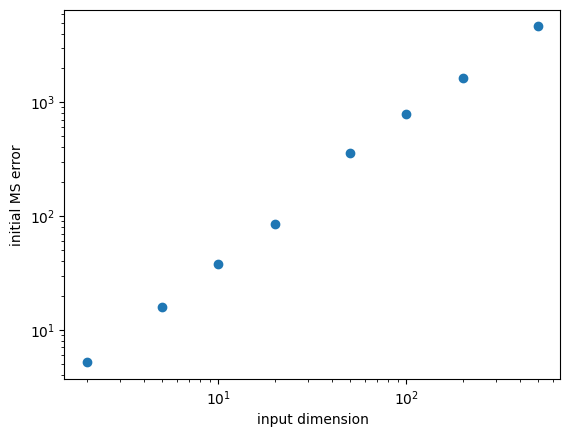

In [32]:
xs = [2, 5, 10, 20, 50, 100, 200, 500]
ys = list(map(initial_error, xs))
plt.loglog(xs, ys, 'o')
plt.xlabel('input dimension')
plt.ylabel('initial MS error')

This is really what we are seeing: the training is not able to overcome the rise in initial error.

In [35]:
from torch import nn

def initial_error_nonconvex(input_dim):
    hidden_size = 200
    CGF_model = CGF_ICNN(torch.randn(1000,  input_dim))
    
    nonconvex_model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
    a = torch.randn(2000, input_dim)

    return CGF_model.lossFn(nonconvex_model.forward(a), CGF_model.empirical_CGF(a)).item()
    
    

Text(0, 0.5, 'initial MS error')

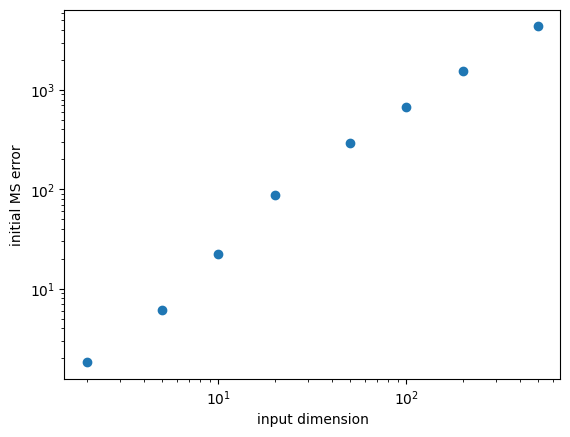

In [39]:
xs = [2, 5, 10, 20, 50, 100, 200, 500]
ys = list(map(initial_error_nonconvex, xs))
plt.loglog(xs, ys, 'o')
plt.xlabel('input dimension')
plt.ylabel('initial MS error')

The initial error scales _THE SAME WAY_ in a non-convex model. Does it learn?

In [49]:
nonconvex_model = CGF_ICNN(torch.randn(1000,  20))

input_dim = 20
hidden_size = 200

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )

In [50]:
train_model(nonconvex_model, None)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Train Loss,█▅▄▅▄▄▄▃▄▃▃▃▃▃▃▂▂▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▅▄▅▄▃▃▃▃▃▃▃▃▃▂▂▃▂▃▂▂▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▃▃▄▄
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█████
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
Train Loss,1.90747
Val Loss,64.11296
epoch,207
trainer/global_step,2703


'./learnedExpFam/gd6joci7/checkpoints/epoch=207-step=2704.ckpt'

Ok, the train loss does improve for the non-convex model, down to single digits.
Interestingly, our _validation loss_ is still not really improving, so the training still stops too early.

In [75]:
nonconvex_model = CGF_ICNN(torch.randn(10000,  20), numsamples=50000, variance=50)

input_dim = 20
hidden_size = 200

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
train_model(nonconvex_model, None)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,██▆▆▅▄▄▅▅▅▄▅▅▃▃▂▃▃▃▃▃▂▂▃▂▂▂▂▂▂▂▂▂▂▁▁▂▂▁▁
Val Loss,▅▄▄▄▃▂▂▃▂▁▂▂▁▅▂▂▃▁▂▃▃▃▄▃▅▅▅▅▄▆▆▆▆▆▇▇█▇██
epoch,▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▇▇▇▇▇▇▇████
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
Train Loss,16.06189
Val Loss,115.75732
epoch,140
trainer/global_step,44132


'./learnedExpFam/q6p92ehk/checkpoints/epoch=140-step=44133.ckpt'

Increasing the number of samples leads to:
1. Much slower improvements in the training set, but still viable
2. Validation loss still doesn't keep up with training loss!

The first make sense: this network is able to overfit a small number of training points or to fit a large number accurately.

The second is harder to understand: maybe we just really need a lot of samples to generalize well?

This is helpful in that it seperates the concerns of trainability and generalization performance.

In [76]:
nonconvex_model = CGF_ICNN(torch.randn(10000,  20), numsamples=50000)

input_dim = 20
hidden_size = 200

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
train_model(nonconvex_model, None)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,▇▇██▆▆▆▄▅▅▄▄▃▄▄▄▃▃▃▃▃▄▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁
Val Loss,█▄▂▂▁▁▃▁▂▁▁▂▂▂▃▃▂▂▃▃▄▃▃▄▄▄▄▄▄▅▅▅▅▅▄▅▅▅▆▅
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███
trainer/global_step,▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
Train Loss,6.53243
Val Loss,44.97134
epoch,136
trainer/global_step,42880


'./learnedExpFam/mmja36sk/checkpoints/epoch=136-step=42881.ckpt'

In [77]:
nonconvex_model.setup()
train_model(nonconvex_model, None)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▅▇▅▅▄▃▄▃▃▂▂▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,▁▁▁▁▃▃▃▃▄▄▅▅▅▆▆▇▆▆▆▆▆▇▇▇▇▇████████▇█████
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇█████
Train Loss,1.53993
Val Loss,46.47579
epoch,104
trainer/global_step,32864


'./learnedExpFam/okyc7ssf/checkpoints/epoch=104-step=32865.ckpt'

Above: automatic variance + retraining with a new set of sample points.

Two points from the retraining:
1. Little improvement in validation performance
2. Little change in the initial learning curves between the two runs.

Both of these features indicate a severe failure to generalize, even though the training data is being learned well.

#### A couple of points:
I think we need to crank up the number of training points. This is exponential in the size of the space, and therefore seems to suffer somewhat from the curse of dimensionality.

We can always resample: in particular, once the validation performance has plateaued, 

#### Quick check: does it improve with larger networks?

Maybe the architecture is bottlenecking, instead of the number of datapoints?

In [79]:
nonconvex_model = CGF_ICNN(torch.randn(10000,  20), numsamples=50000)

input_dim = 20
hidden_size = 1000

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
train_model(nonconvex_model, None)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.096     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▆▆▇▅▅▅▄▄▅▃▃▄▃▂▂▂▂▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,▇▃█▂▄▃▁▁▅▁▂▃▃▂▂▂▃▂▃▃▃▃▃▄▃▄▃▃▃▃▃▃▃▃▃▄▃▃▃▃
epoch,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███
Train Loss,1.57407
Val Loss,41.48633
epoch,132
trainer/global_step,41628


'./learnedExpFam/mgsofagu/checkpoints/epoch=132-step=41629.ckpt'

More capacity gives faster learning on the train set, but no improvement in terms of validation.

#### How many points do we need?

(keeping the bigger network)
Upper end of what my computer can handle: 1E6 datapoints

That said, with some smarter coding practices, I could generate the data more efficiently and increase this further.

In [7]:
nonconvex_model = CGF_ICNN(torch.randn(10000,  20), numsamples=1000000)

input_dim = 20
hidden_size = 1000

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
train_model(nonconvex_model, None)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.096     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▅▄▄▃▄▃▄▄▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁
Val Loss,█▃▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▂▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▆▆▇▇▇▇███
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█
Train Loss,7.52224
Val Loss,17.23024
epoch,184
trainer/global_step,1156249


'./learnedExpFam/dnb6pczv/checkpoints/epoch=184-step=1156250.ckpt'

Validation seems to be keeping pace with the train error.

Is it worth the cost of training the network??

Really, that depends on how often we are evaluating duals, etc, which we are able to do with the empirical expressions alone.

* $10^6$ data points: minimum validation error: ~ 16
* 50k data points: min validation error ~ 38

Note that for the 1 million point case, the training error was approaching 7 when training terminated.

#### Provisional conclusion: we need more data-points as the dimensionality scales upward.

This is not surprising, and we should expect the number of points that we need to scale exponentially with the dimensionality of the space.
Some approaches that we can use to handle this:
- resample data as we train, either periodically or when validation suffers
- could put some active learning model to use for new data-point selection.


### we also need to address: the failure of the ICNN model

This model seems to learn less than the non-convex model, in the sense that it fails to overfit on small data. 
That is, the training error does not get as small for ICNNs as for MLPs.



In [12]:
convex_model = CGF_ICNN(torch.randn(1000,  20))

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▆▂▂▂▂▂▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▇▇▇▇▇▇████
Train Loss,26.97952
Val Loss,44.18196
epoch,361
trainer/global_step,4705


'./learnedExpFam/uwd9rzez/checkpoints/epoch=361-step=4706.ckpt'

Could it be that it simply learns slower? And the validation plateaus the same rate, so the early stopping makes it look like a worse fit?

In [15]:
convex_model = CGF_ICNN(torch.randn(1000,  20))
train_model(convex_model, None, patience=500)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,██▇▂▂▂▂▁▁▁▁▁▁▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇███
trainer/global_step,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
Train Loss,12.65343
Val Loss,44.42851
epoch,819
trainer/global_step,10659


'./learnedExpFam/hrymxg59/checkpoints/epoch=819-step=10660.ckpt'

Ans: No. It seems to pleateau.

In [17]:
convex_model = CGF_ICNN(torch.randn(1000,  20),  numsamples=128)
train_model(convex_model, None, patience=500)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,██▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇████
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇███
Train Loss,0.05783
Val Loss,277.27069
epoch,549
trainer/global_step,549


'./learnedExpFam/25tdm91o/checkpoints/epoch=549-step=550.ckpt'

However, with a small enough sample size, the network does seem to be able to overfit on the training data! 
- 128 achieves `0.06` train error in 550 epochs
- 128 achieve `2E-12` train error in 4k epochs

In [18]:
convex_model = CGF_ICNN(torch.randn(1000,  20),  numsamples=128)
train_model(convex_model, None, patience=5000)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



More points, same number of layers

In [22]:
convex_model = CGF_ICNN(torch.randn(1000,  20),  numsamples=1000)
train_model(convex_model, None, patience=5000)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (7) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▃▂▁▁▁▁▁▂▁▁▁▂▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇██
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇███
Train Loss,1.10705
Val Loss,62.87045
epoch,5250
trainer/global_step,36756


'./learnedExpFam/p3zgv1xa/checkpoints/epoch=5250-step=36757.ckpt'

Train loss consistently improves. It is just very slow to do so.

Increase learning rate?


In [23]:
convex_model = CGF_ICNN(torch.randn(1000,  20),  numsamples=1000, lr=8E-3)
train_model(convex_model, None, patience=5000)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (7) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Train Loss,▆█▆▆▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▂▂▁▁▁▁▁▁▁▂▁▁▂▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▃▂▂▂▂▂▂▂▂▂
epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇█
trainer/global_step,▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████
Train Loss,0.02034
Val Loss,67.98737
epoch,5239
trainer/global_step,36679


'./learnedExpFam/xrrkm61d/checkpoints/epoch=5239-step=36680.ckpt'

Bumping up the learning rate totally works. No where close to as fast as the non-convex version, but much better than the previous.

Even faster?

In [26]:
convex_model = CGF_ICNN(torch.randn(1000,  20),  numsamples=1000, lr=1E-1)
train_model(convex_model, None, patience=5000)

Train Loss,▆█▆▇▄▅▄▄▃▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂▁▁▂
Val Loss,▇▁▁▁▁▃▃▅▆▅▂▆▃▄▂▅▂▃▃▅▅▄▅█▆▅▅▄▆▄▇▄▅▇▆▇▇▇▆▇
epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█
trainer/global_step,▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇█
Train Loss,2.2033
Val Loss,75.13007
epoch,1502
trainer/global_step,10520


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (7) is smaller than the logging interval Trainer(log_every_n_steps=30). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



NameError: name 'exit' is not defined

### What does this mean, and what does it point to that we should do?

__Meaning:__
- This model is naturally more regularized? Due to convex restriction? Due to lower effective sample size?
- This could be a result of the Adam optimizer converging on very small step sizes during training, making slower learners worse?

__Way forward:__
- Maybe just try a model with a massive number of samples?


__Data:__
- 128 points: `2E-12` train error
- 1000 points: `0.57` train error
- 1000 points, high learning rate `8E-3`: `0.01` train error 
- `learning rate `1E-1` is too high.

- `1E6` points: `32` validation error, `15.5` train error
- `1E6` points, non-convex: `16` validation error, `4` train error

In [27]:
convex_model = CGF_ICNN(torch.randn(5000,  20),  numsamples=1000000, lr=8E-3)
train_model(convex_model, None, patience=500)

Train Loss,██▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,██▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▇▇▇▇▇████
trainer/global_step,▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇████
Train Loss,129.40051
Val Loss,163.776
epoch,2211
trainer/global_step,15479


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

Validation: |                                                                                            | 0/?…

wandb-core(54146) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54149) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54153) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54155) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54156) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54157) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54158) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54164) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54165) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54166) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54168) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54169) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54170) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54180) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54184) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54189) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54193) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54198) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54203) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54213) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54214) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54215) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54216) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54218) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54220) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54222) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54223) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                            | 0/?…

wandb-core(54228) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54229) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54231) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54232) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54233) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54234) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54235) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54237) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54239) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54241) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54242) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54246) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54255) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54260) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54264) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54266) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54267) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54269) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54270) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54272) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54274) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54275) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54277) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54280) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54285) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54286) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54287) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54288) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54289) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54292) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54295) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54297) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54298) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54299) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54300) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54301) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54305) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54306) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54307) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54308) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54310) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54313) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54315) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54317) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54318) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54326) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54329) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54331) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54333) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54334) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54335) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54336) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54338) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54340) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54342) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54344) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54345) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54346) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54347) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54348) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54351) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54356) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54357) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54358) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54367) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54368) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54383) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54391) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54393) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54398) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54400) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54401) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54403) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54404) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54406) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54408) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54410) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54413) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54416) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54417) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54419) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54421) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54422) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54423) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54425) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54426) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54427) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54429) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54430) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54432) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54434) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54436) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54438) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54441) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54442) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54443) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54445) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54447) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54448) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54450) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54451) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54453) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54455) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54456) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54458) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54459) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54460) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54461) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54465) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54467) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54468) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54469) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54471) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54474) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54476) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54478) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54480) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54481) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54482) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54483) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54486) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                            | 0/?…

wandb-core(54495) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54516) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54550) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54565) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54567) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54583) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54605) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54608) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54629) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54668) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54676) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54690) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54697) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54722) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54745) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54756) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54765) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54771) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54773) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54777) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54778) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54781) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54792) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54802) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54832) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54850) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54866) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54895) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54898) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54899) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54904) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54909) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54912) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54918) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54922) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54927) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54934) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54937) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54939) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(54951) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54953) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54954) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54955) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54957) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54958) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54979) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54981) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54982) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(54983) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(54991) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55009) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55011) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

wandb-core(55014) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55035) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55046) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55059) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55060) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55061) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55063) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55065) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55066) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55067) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55068) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55083) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

wandb-core(55102) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55103) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55107) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55111) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55133) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55152) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55160) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55164) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55169) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55177) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55180) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55182) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55198) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55216) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55233) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55258) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55277) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55297) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55322) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55325) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55326) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55341) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55359) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55363) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

wandb-core(55373) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55374) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55375) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55378) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

wandb-core(55387) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55388) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55390) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55392) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55393) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55394) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55399) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55400) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55401) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55403) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55405) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55406) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55409) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55411) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55413) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55415) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55416) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55417) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55420) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55423) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55424) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55426) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55428) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55429) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55432) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55433) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55435) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55437) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55438) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55439) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55450) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55452) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55453) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55455) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55457) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55465) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55467) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55468) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55472) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55475) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55478) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55480) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55482) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55484) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55485) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55487) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55489) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55491) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55493) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55494) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55496) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55498) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55499) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55502) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55504) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55506) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55507) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55509) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55511) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55512) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55517) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55518) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55520) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55522) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55523) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55525) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55527) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55529) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55530) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55532) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55535) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55536) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55539) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55540) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55542) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55544) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55546) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55549) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55552) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55555) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55556) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55558) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55560) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55561) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55563) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55564) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55566) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55568) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55570) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55573) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55578) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55580) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55583) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55586) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55588) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55589) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55593) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55594) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55596) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55598) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55600) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55602) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55606) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55607) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55610) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55612) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55614) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55616) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55618) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55619) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55621) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55623) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55625) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55626) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55631) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55632) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55634) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55636) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55638) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55639) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55643) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55654) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55656) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55658) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55660) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55661) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55665) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55666) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55669) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55671) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55673) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55675) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55677) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55678) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55680) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55682) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55683) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55684) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55689) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55690) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55693) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55695) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55697) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55698) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55700) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55701) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55703) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55705) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55707) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55708) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55715) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55716) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55717) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55721) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55723) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55724) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55725) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55726) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55728) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55732) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55734) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55735) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55737) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55738) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55739) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55743) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55746) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55747) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55749) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55750) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55753) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55755) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55757) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55758) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55763) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55764) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55765) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55769) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55771) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55772) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55776) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55777) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55779) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55781) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55783) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55784) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55789) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55790) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55791) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55795) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55797) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55800) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55803) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55804) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55806) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55808) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55810) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55811) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55816) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55817) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55818) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55823) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55824) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55825) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55829) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55830) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55832) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55834) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55836) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55837) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55845) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55846) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55847) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55849) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55853) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55854) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55858) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55859) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55861) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55863) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55865) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55866) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55870) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55871) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55873) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55874) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55878) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55880) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55882) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55883) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55885) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55886) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55889) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55890) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55894) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55895) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
wandb-core(55896) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Validation: |                                                                                        | 0/? [00…

wandb-core(55905) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.

Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

I killed it early. The convex model is worse than the non-convex, but it's not dramatic, only about 2 fold. I don't think there is much to be gain by focused optimization of the convex model specifically.

### Periodically resample the data

In [2]:
%run icnn.py
from trainers import train_model

In [3]:
convex_model = CGF_ICNN(torch.randn(5000,  28),  numsamples=200000, lr=8E-3, resample_freq=20)

In [4]:
train_model(convex_model, None, patience=200)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 20 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 40 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 60 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 80 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 100 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 120 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 140 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 160 20


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

It doesn't appear to catch up with the 1 million datapoint case.
This is probably because the learning is not able to extract everything that it needs from the data as we present it bit-by-bit.
The validation error does continue improving, but this might be the slowest way to go about things.

Moreover, there could be some impact of the optimizer getting stuck in more local states. Might have to reinitialize the optimizer when we resample the data.
More fiddling is required.

Another question: are we actually seeing the new data if we don't reintialize the dataloaders?

In [3]:
nonconvex_model = CGF_ICNN(torch.randn(10000,  20), numsamples=int(1E6), resample_freq=50)

input_dim = 20
hidden_size = 1000

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
    )
train_model(nonconvex_model, None, patience=105)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.096     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                   | 0/? [00…

Training: |                                                                                          | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

resample 50 50


Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…

Validation: |                                                                                        | 0/? [00…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Again, no improvement on the resample. 

#### I have to reinitialize the dataloaders in order for this to work.

In [31]:
%run icnn.py
%run trainers.py

In [30]:
convex_model = CGF_ICNN(torch.randn(5000,  20),  numsamples=100000, lr=8E-3, resample_freq=50)
train_model(convex_model, None)

Train Loss,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▆▅▃▃▂▂▂▁▂▂▁▁▂▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇███
Train Loss,0.11031
Val Loss,0.01597
epoch,15
trainer/global_step,4859


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 84.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
84.8 K    Trainable params
0         Non-trainable params
84.8 K    Total params
0.339     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                | 0/? [00:00…

reload


Training: |                                                                                       | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 50 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 100 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 150 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 200 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 250 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 300 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 350 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

resample 400 50
reload


Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Train Loss,█▄▅▄▄▃█▂▅▅▆▃▅▇▃▅▅▄▄▅▂▃▄▇▂▅▄▁▃▃▁▅▃▇▄▅▄▄▃▅
Val Loss,█▄▅▅▄▃▃▃▃▄▂▂▂▂▂▁▂▂▂▃▂▂▂▂▂▁▂▁▂▂▁▁▁▁▁▂▁▁▁▂
epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇██
Train Loss,31.63416
Val Loss,32.00119
epoch,410
trainer/global_step,256874


'./learnedExpFam/z2yeksl2/checkpoints/epoch=410-step=256875.ckpt'

Notes:

- 100k samples at 20 dimensions seems comparable to 1 M samples at 28 dimensions in terms of learning curves.
- resampling is definitely not leagues ahead, which might indicate a lack of expressability.

There might be some improvement, but it's not super clear. I guess the main question is whether resampling is more effective than just using all of the data at once. There is also the question of reinitializing the optimizer.

### Systematic study of resampling

In [7]:
%run icnn.py
%run trainers.py

In [8]:
input_dim = 28
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E6))

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)

In [10]:
train_model(nonconvex_model, 'trainedParameters/debugbig/5Mnoresamp/')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                | 0/? [00:00…

reload


Training: |                                                                                       | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

#### The curse of dimensionality is _strong_.
This case, with 28 dimensions and 5x the amount of data is significantly worse than 20 dimensions!
We might have no choice but to limit the dimensionality of our layers. 

That raises another question: how well does a relatively small number of data-points capture the empirical CGF if we have a high number of dimensions?
This might be the bottleneck that would prevent the method from working even if the CGF network is effective at capturing the eCGF

#### Quick check with 10 dimensions:

In [11]:
input_dim = 10
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E6))

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)

In [12]:
train_model(nonconvex_model, 'trainedParameters/debugbig/10dim/')

Train Loss,▇▄▅▅█▂▃▅▃▃▄▄▃▂▄▃▄▃▅▂▂▅▄▄▅▃▃▄▃▄▄▅▄▅▄▂▂▂▄▁
Val Loss,█▅▄▃▃▄▃▂▂▂▂▂▂▂▂▂▁▂▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇██
Train Loss,36.34314
Val Loss,34.30074
epoch,19
trainer/global_step,725159


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.056     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                         | 0…

reload


Training: |                                                                                                | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

Validation: |                                                                                              | 0…

RuntimeError: Shared memory manager connection has timed out

Much improved... down to ~0.4 error.

The question remains: what dimensionality do I really need to be able to fit?
Active learning approaches for training point selection.

### Maybe the normal sampling breaks down in higher dimensions?

In [30]:
inputs = torch.randn(10000, 10)
input_norm = torch.norm(inputs, dim=1)

errors = torch.abs( nonconvex_model.forward(inputs).squeeze() - nonconvex_model.empirical_CGF(inputs) ).detach()

Text(0.5, 0, 'input norm')

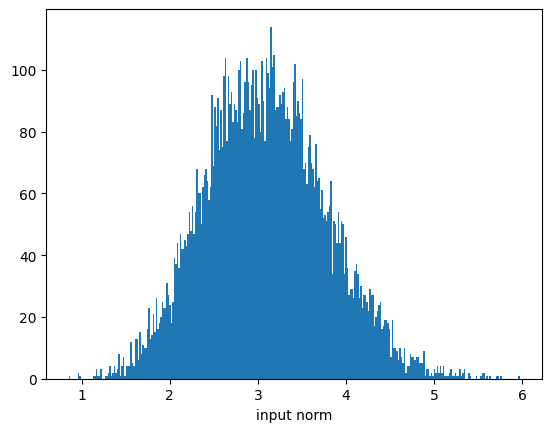

In [34]:
plt.hist(input_norm, bins=300);
plt.xlabel('input norm')

Note that the input norms are far from zero!

Text(0, 0.5, 'error')

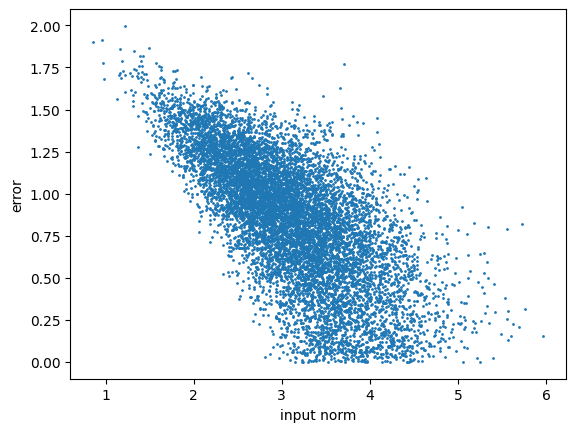

In [35]:
plt.scatter(input_norm, errors, s=1)
plt.xlabel('input norm')
plt.ylabel('error')

As a result of the concentration of the high dimensional normal distribution at the outer shell, the network is learned most accurately, at higher norms.
I can definitely see how this could make fitting significantly more difficult. Not to mention, we really care about the CGF near zero.

Text(0.5, 0, 'output value')

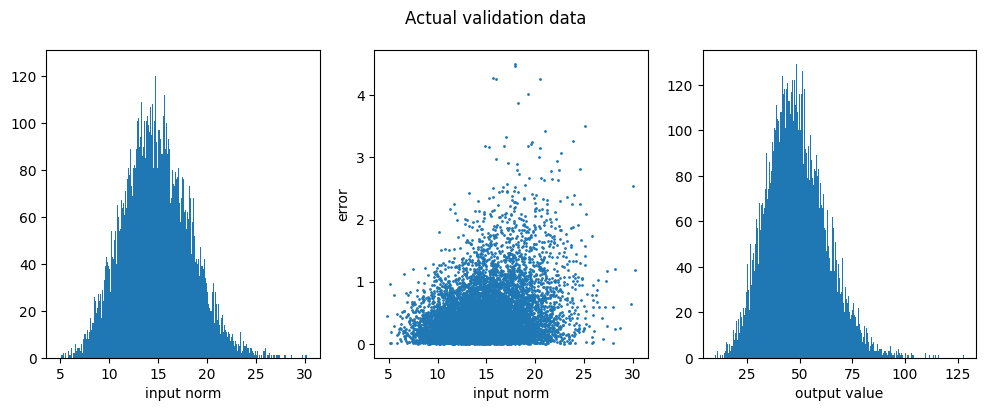

In [117]:
figsize(12, 4)
inputs = nonconvex_model.val_split[0:10000][0]
input_norm = torch.norm(inputs, dim=1)
errors = torch.abs( nonconvex_model.forward(inputs).squeeze() - nonconvex_model.empirical_CGF(inputs) ).detach()
plt.subplots(1,3)
plt.suptitle('Actual validation data')
plt.subplot(1,3,1)
plt.hist(input_norm, bins=300);
plt.xlabel('input norm')

plt.subplot(1,3,2)
plt.scatter(input_norm, errors, s=1)
plt.xlabel('input norm')
plt.ylabel('error')

plt.subplot(1,3,3)
plt.hist(nonconvex_model.forward(inputs).squeeze().detach(), bins=300);
plt.xlabel('output value')

The behavior is even more pronounced in the actual validation data. Also, I can see how this would make the model very difficult to fit: we are dealing with only the very edges of the CGF, and they all have large values for the most part.

Another salient point: the error levels that we were able to achieve were actually pretty good considering the size of target outputs.

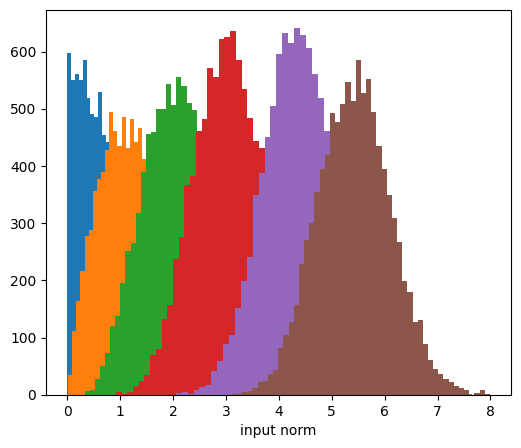

In [110]:
figsize(6,5)
for input_dim in [1, 2, 5, 10, 20, 30]:
    inputs = torch.randn(10000, input_dim)
    input_norm = torch.norm(inputs, dim=1)
    plt.hist(input_norm, bins=50);
    plt.xlabel('input norm')

The behavior is specific to high dimensions

Text(0.5, 1.0, 'uniform distribution')

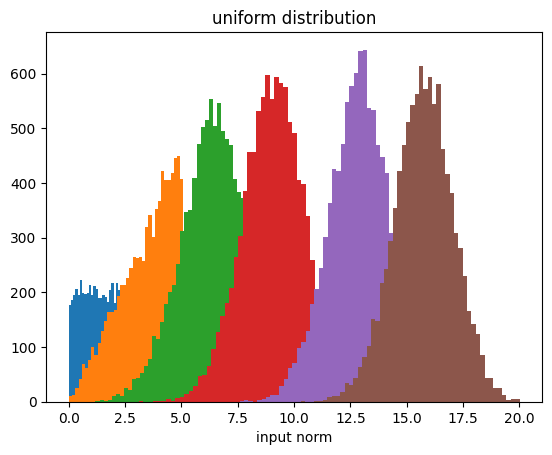

In [49]:
for input_dim in [1, 2, 5, 10, 20, 30]:
    inputs = 10*torch.rand(10000, input_dim)-5
    input_norm = torch.norm(inputs, dim=1)
    plt.hist(input_norm, bins=50);
    plt.xlabel('input norm')
plt.title('uniform distribution')

In [80]:
def origin_concentrated_sampling(n_samples, dim, radius_var=1):
    """ high dimensional sampling that is concentrated at the origin """
    angles = torch.randn(n_samples, input_dim)
    angles = angles / torch.norm(angles, dim=1)[:, None]

    samples = angles * torch.randn(n_samples, 1) * radius_var**0.5
    return samples

Text(0.5, 1.0, 'Origin Concentrated')

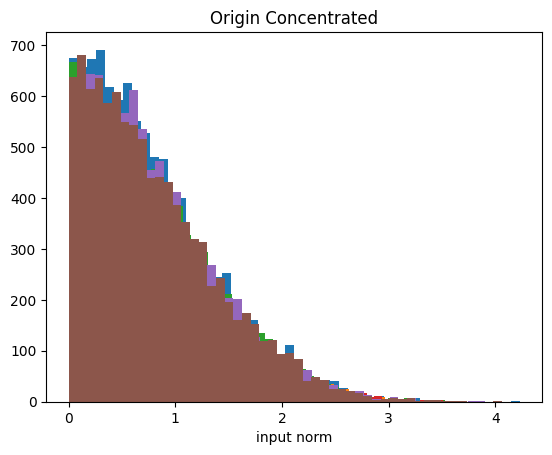

In [85]:
for input_dim in [1, 2, 5, 10, 20, 30]:
    inputs =  origin_concentrated_sampling(10000, input_dim, radius_var=1)
    input_norm = torch.norm(inputs, dim=1)
    plt.hist(input_norm, bins=50);
    plt.xlabel('input norm')
plt.title('Origin Concentrated')

Text(0.5, 1.0, 'Impact of changing variance')

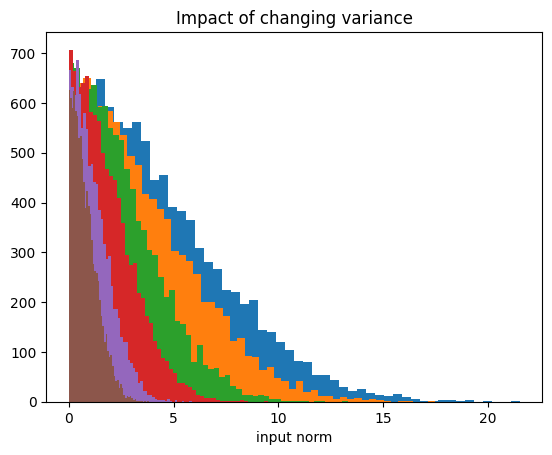

In [88]:
for input_var in [1, 2, 5, 10, 20, 30][::-1]:
    inputs =  origin_concentrated_sampling(10000, 10, radius_var=input_var)
    input_norm = torch.norm(inputs, dim=1)
    plt.hist(input_norm, bins=50);
    plt.xlabel('input norm')
plt.title('Impact of changing variance')

In [270]:
nonconvex_model_old = nonconvex_model

Shall we try training with that distribution?

In [262]:
from scipy.stats import rv_continuous, chi

class Normal_radius(rv_continuous):
    """ Multivariate distribution that is uniform in space, but has
        a chi(1) marginal distribution along the radius, like a
        normal distribution

        Prevents the samples from accumulating at large radii in high
        dimensions
    """
    def __init__(self, n_dims, stdev):
        self.n_dims = n_dims
        self.scale_dist = chi(1, scale=stdev)

    def rvs(self, n_samples):
        angles = np.random.randn(n_samples, self.n_dims)
        angles = angles / np.linalg.norm(angles, axis=1)[:, None]

        radii = self.scale_dist.rvs((n_samples, 1))
        return angles * radii

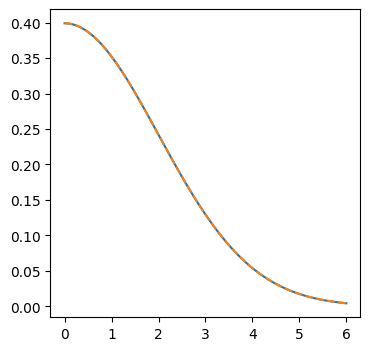

In [263]:
from scipy.stats import gamma, norm, chi

std=2

xs = np.linspace(0, 6, 100)
plt.plot(xs, 2*norm(0, std).pdf(xs))
plt.plot(xs, chi(1, scale=std).pdf(xs), '--')

In [264]:
norm(0, var).rvs(10000).var()

np.float64(4.0252079010981605)

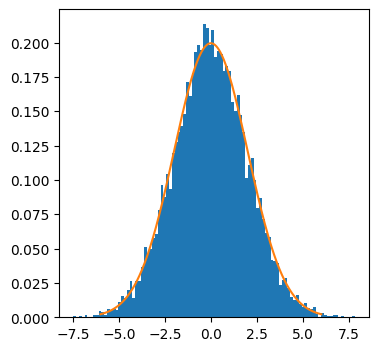

In [273]:
std=2

_= plt.hist(Normal_radius(1, std).rvs(10000).squeeze(), bins=100, density=True)
xs = np.linspace(-6, 6, 1000)
plt.plot(xs, norm(0, scale=std).pdf(xs))

Tests passing

That is exactly what was happening

### training with narrow distribution

In [274]:
%run icnn.py

<Figure size 400x400 with 0 Axes>

In [275]:
input_dim = 10
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5), variance=5.)

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)

In [276]:
train_model(nonconvex_model, 'trainedParameters/debugbig/10dim_compact/')

Train Loss,▆█▄▄▅▃▃▂▂▃▂▃▃▃▂▂▃▂▂▂▁▂▁▂▂▂▃▂▂▂▂▂▁▁▁▁▂▂▁▂
Val Loss,█▆▄▃▃▂▂▃▂▂▂▂▂▂▂▂▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█
Train Loss,0.28625
Val Loss,0.38448
epoch,82
trainer/global_step,3062669


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.056     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Train Loss,█▆▃▅▄▄▃▂▃▄▂▂▂▂▂▂▂▁▁▂▂▂▁▁▁▂▁▂▁▂▂▁▁▂▁▁▁▂▁▁
Val Loss,█▅▃▃▃▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
Train Loss,0.0017
Val Loss,0.01224
epoch,732
trainer/global_step,2720162


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/10dim_compact/validation-epoch=632-step=2349063.ckpt'

Ok nice. This is fitting very nicely, and achieving very low ~0.01 validation error

#### Convex model:

In [277]:
input_dim = 10
hidden_size = 1000

convex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5), variance=5.)

In [278]:
train_model(convex_model, 'trainedParameters/debugbig/10dim_compact/')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/10dim_compact exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 82.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
82.8 K    Trainable params
0         Non-trainable params
82.8 K    Total params
0.331     Total estimated model para

Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Wow, also great. It's not learning as fast as the non-convex model, but still achieves very reasonable performance in the small number of steps I give it

#### increasing the variance:

__Convex__:

In [279]:
input_dim = 10
hidden_size = 1000

convex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5))

train_model(convex_model, 'trainedParameters/debugbig/10dim_fullvar/')

Train Loss,▇▇▆▄▃▂▂▂▇▂▄▄▃▁▅▄▁▃▃▃▅▁▃▂▂▃▂▂▂▂▃▅▂▁▅██▁▄▂
Val Loss,█▅▅▅▄▄▃▃▃▃▃▃▃▂▂▃▂▃▂▂▂▂▂▂▂▂▁▁▁▂▂▂▂▂▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇████
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
Train Loss,0.02366
Val Loss,0.05604
epoch,46
trainer/global_step,172529


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 82.8 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
82.8 K    Trainable params
0         Non-trainable params
82.8 K    Total params
0.331     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Interesting: back to the performance that is similar to mv gaussian sampling with 5M samples. Back up to ~1 validation error.

__nonconvex__

In [280]:
input_dim = 10
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5))

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)
train_model(nonconvex_model, 'trainedParameters/debugbig/10dim_fullvar/')

Train Loss,▅▅▄█▆▆▁█▄▁▄▆▂▂▂▃▃▄▂▄█▆▃▃▃▁▄▄▅▇▄▃▁▂▅▄▅▁▃▃
Val Loss,█▇▆▅▄▄▄▃▃▃▃▃▂▃▃▂▂▂▃▂▂▂▃▂▂▂▁▁▁▃▁▁▁▁▁▂▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇██
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇████
Train Loss,0.88338
Val Loss,0.93667
epoch,122
trainer/global_step,452849


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/10dim_fullvar exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.056     Total estimated model para

Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Similarly to the convex case. Again, a little better than the convex, but still not great.

It is actually better than the multivariate normal, and does see significant improvement.

This is a place where the convex case could be improved.


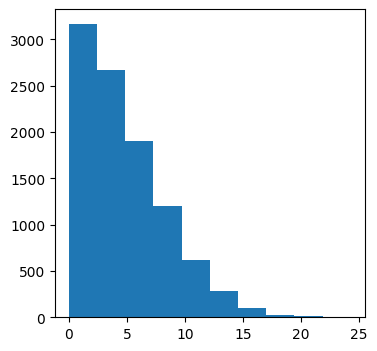

In [286]:
plt.hist(torch.norm(nonconvex_model.train_split[0:10000][0], dim=1));


__28 dimensions__

In [288]:
input_dim = 28
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5), variance=5.)

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)
train_model(nonconvex_model, 'trainedParameters/debugbig/28dimconcentrated/')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Starts small

In [289]:
input_dim = 28
hidden_size = 1000

convex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5), variance=5.)

train_model(convex_model, 'trainedParameters/debugbig/28dimconcentrated/')

Train Loss,▅▅▄▄▃▅▃▄▃▄▂▂▂▂▃▂▂▁▂▂▂▁▁▂▃▂█▁▃▃▆▄▅▃▃▁▂▁▃▃
Val Loss,▆█▃▃▂▂▂▃▄▁▂▂▂▂▁▂▃▂
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇█████
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇██
Train Loss,0.237
Val Loss,0.12053
epoch,18
trainer/global_step,67139


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/28dimconcentrated exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model 

Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Starts small too.

__Default variance, 28 dims__

In [290]:
input_dim = 28
hidden_size = 1000

nonconvex_model = CGF_ICNN(torch.randn(10000,  input_dim), numsamples=int(5E5))

nonconvex_model.model = nn.Sequential(
        nn.Linear(input_dim, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, hidden_size),
        nn.Softplus(),
        nn.Linear(hidden_size, 1,)
)
train_model(nonconvex_model, 'trainedParameters/debugbig/28dimconcentrated/')

Train Loss,█▂▃▃▂▂▂▁▁▃▁▂▁▁▁▁▁▂▂▁▁▂▂▂▂▁▂▁▁▁▁▂▁▁▁▂▁▁▁▁
Val Loss,█▄▃▂▂▂▂▂▂▁▁▁▂▂
epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇█
trainer/global_step,▁▁▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█
Train Loss,0.0636
Val Loss,0.12647
epoch,14
trainer/global_step,55649


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/28dimconcentrated exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 2.0 M  | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.128     Total estimated model 

Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Starts in single digits, and doesn't learn much more that that. Significantly worse than the low variance version.

Text(0.5, 1.0, 'norm distribution')

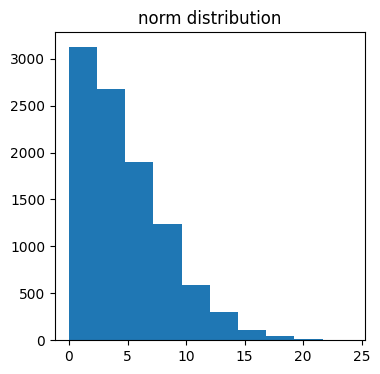

In [302]:
plt.hist(torch.norm(nonconvex_model.train_split[0:10000][0], dim=1));
plt.title('norm distribution')

Text(0, 0.5, 'error')

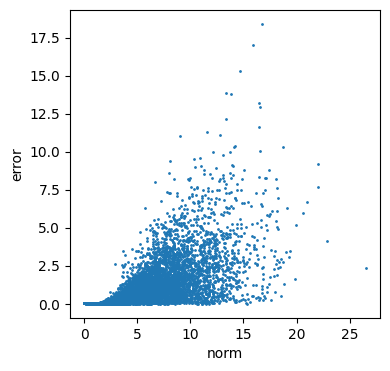

In [304]:
inputs, targets = nonconvex_model.val_split[0:10000]

error = torch.abs( nonconvex_model.forward(inputs) - targets)
plt.scatter(torch.norm(inputs, dim=1).detach(), error.detach(), s=1)
plt.xlabel('norm')
plt.ylabel('error')

Now the error is significantly correlated with the distance from the origin.

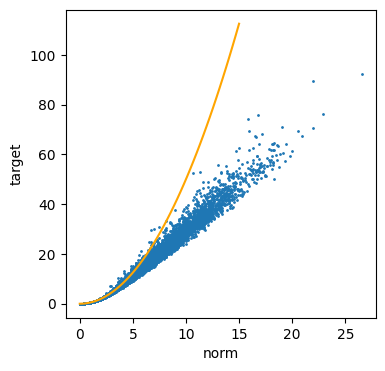

In [310]:
plt.scatter(torch.norm(inputs, dim=1).detach(), targets, s=1)
plt.xlabel('norm')
plt.ylabel('target')

xs = np.linspace(0, 15)
plt.plot(xs, 0.5*xs**2, 'orange')

This plot makes it look like the empirical CGF is significantly into its linear component by the time the divergence occurs.

#### Summary:

- Concentrated data learns to significantly better validation error.
- Highly concentrated data gets low validation even at 28 dimensions
- Increasing variance singnificantly impacts performance, worse for convex networks and higher dimensions.
- The large variance regions appear to be in regions where the eCGF is already a straight line.

Questions
- How much variance do I really need?
- Does increasing the capacity of the network decrease the validation error?
- More samples?
- What is the right metric for judging these CGF? Is there a better way to determine variance requirements?


#### Continued investigation:

__Impact of larger variance in the data itself__

In [311]:
input_dim = 28
hidden_size = 1000

convex_model = CGF_ICNN(5*torch.randn(10000,  input_dim), numsamples=int(5E5), variance=5.)

train_model(convex_model, 'trainedParameters/debugbig/28dimconcentrated/')

Train Loss,▅▆█▅▆▅▆▄▅▄▃▄▂▂▃▂▂▄▃▃▃▂▃▃▃▂▂▂▂▁▂▂▁▁▁▂▁▁▁▁
Val Loss,█▆▄▅▃▃▃▂▁▁▂▂▁▁▁▂▁▁▂▂▂▂▂▂▃▂▃▂▂▂▂▃▃▃▂▄▃▄▃▃
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇████
trainer/global_step,▁▂▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
Train Loss,0.40975
Val Loss,2.47366
epoch,98
trainer/global_step,366779


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/debugbig/28dimconcentrated exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model 

Sanity Checking: |                                                                                            …

reload


Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Interesting. It's back to being very bad again... ~50 validation error after the first round of training. Gets down to ~10 validation error by the time training is completed.

This seems to point toward whitening of the input data being important, but I'm a little concerned about the impact on conditional CGFs

Killed the training a little early, but I'm curious to see what the network actually learned.

Text(0.5, 1.0, 'norm distribution')

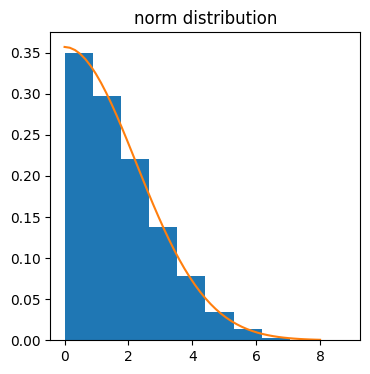

In [327]:
plt.hist(torch.norm(convex_model.train_split[0:10000][0], dim=1), density=True);

xs = np.linspace(0, 8)
plt.plot(xs, 2*norm(0, 5**0.5).pdf(xs))
plt.title('norm distribution')

Text(0, 0.5, 'error')

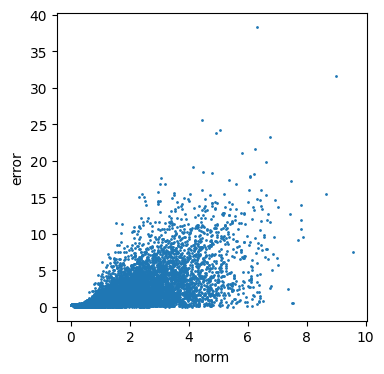

In [313]:
inputs, targets = convex_model.val_split[0:10000]

error = torch.abs(convex_model.forward(inputs) - targets)
plt.scatter(torch.norm(inputs, dim=1).detach(), error.detach(), s=1)
plt.xlabel('norm')
plt.ylabel('error')

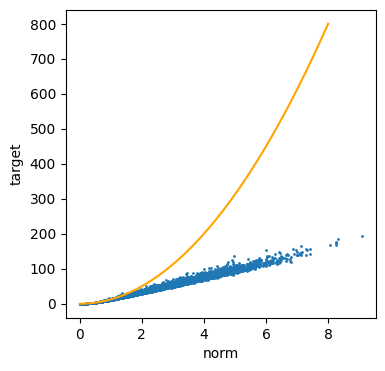

In [340]:
plt.scatter(torch.norm(inputs, dim=1).detach(), targets, s=1)
plt.xlabel('norm')
plt.ylabel('target')

xs = np.linspace(0, 8)
plt.plot(xs, 25/2*xs**2, 'orange')

Huh. it looks like the region that is well fit is again well into the non-linear region.
We could certainly improve the fits around norms 0.5-2, but there is quite significant growth in the target values.

Text(0, 0.5, 'empirical CGF error')

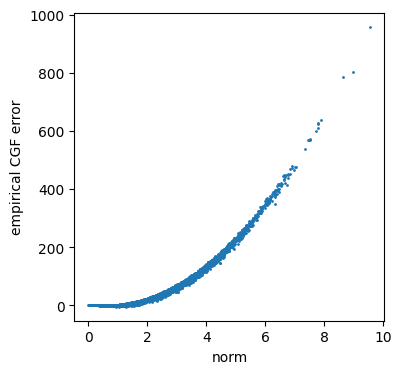

In [341]:
inputs, targets = convex_model.val_split[0:10000]

error = 25/2*torch.einsum('Nd, Nd -> N', inputs, inputs) - targets.squeeze()
plt.scatter(torch.norm(inputs, dim=1).detach(), error.detach(), s=1)
plt.xlabel('norm')
plt.ylabel('empirical CGF error')

The ground truth above seems to be correct.

I guess it makes sense that the CGF should have larger values if it has greater variance. After all, the variance acts as a multiplication factor on $\theta^T x$ in the exponent.

Looking at the CGF equation:
$$
\mathbb{E}_x[ \exp(\theta^T x)]
$$

It is clear that scaling $\theta$ and scaling $x$ should have the same influence on the size of the outputs.

__Q:__ Do the learned networks linearly extrapolate beyond their training data?

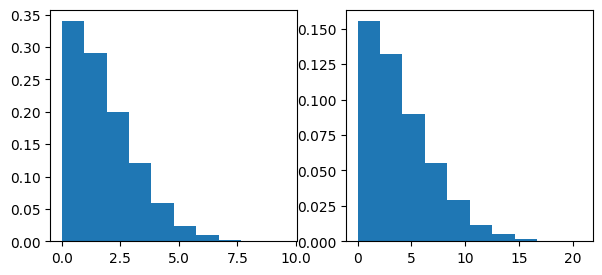

In [362]:
figsize(7,3)
plt.subplots(1,2)

plt.subplot(1,2,1)
validation, _ = convex_model.val_split[0:10000]
plt.hist(torch.norm(validation, dim=1), density=True);

plt.subplot(1,2,2)
extrap_inputs = normal_radius_uniform_angle(28, 5).rvs(10000)
plt.hist(torch.norm(extrap_inputs, dim=1), density=True);

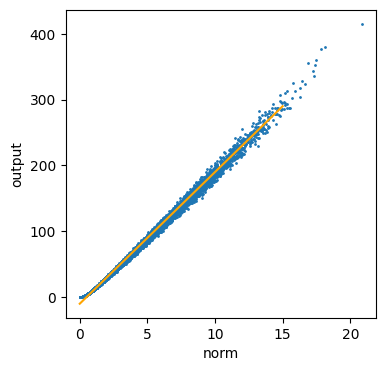

In [372]:
figsize(4,4)
plt.scatter(torch.norm(extrap_inputs, dim=1).detach(), convex_model.forward(extrap_inputs).detach(), s=1)
plt.xlabel('norm')
plt.ylabel('output')

xs = np.linspace(0, 15)
plt.plot(xs, 20*xs - 10, 'orange')

This is an arbitrary line, but we see that the extrapolation:
1. Is fairly linear
2. Does get noisier (in $y$) as the norm increases

Note also that 

In [436]:
data = torch.randn(10000, 28)

maxes = torch.topk(data, 2, dim=0).values

In [453]:
torch.log(torch.tensor(2)) / torch.min(-torch.diff(maxes, dim=0))

tensor(26.3504)

This is way too big to use as the baseline...

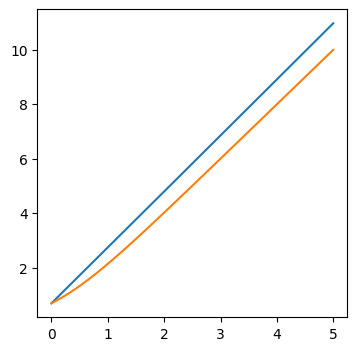

In [524]:
theta = torch.linspace(0, 5, 500)
outputs = torch.logsumexp(torch.stack([2.1*theta, 2*theta]), 0)
plt.plot(theta, outputs)

outputs = torch.logsumexp(torch.stack([0.11*theta, 2*theta]), 0)
plt.plot(theta, outputs)

Being similar in magnitude does not mean that the output is not close to linear!

In [556]:
N = 10000
norms = torch.norm(extrap_inputs[0:N], dim=1)
dets = torch.det(vmap(hessian(convex_model.empirical_CGF))(extrap_inputs[0:N]))

(0.0, 20.0)

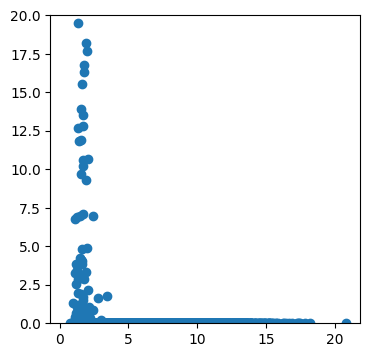

In [557]:
plt.scatter(norms, dets)
plt.ylim([0, 20])

In [558]:
dets[18]

tensor(inf)

In [559]:
H = vmap(hessian(convex_model.empirical_CGF))(extrap_inputs[0:N])[18]

In [560]:
torch.det( H.double())

tensor(1.3127e+39, dtype=torch.float64)

In [562]:
np.linalg.cond(H)

np.float32(1.392652)

In [565]:
val, vec = torch.linalg.eig(H)

In [574]:
torch.prod(val.real)

tensor(inf)

This is comforting from the perspective of choosing the right output width, but raises another issue:
__We need to compute determinants for our saddlepoint approximation, but that may not be doable!__



In [585]:
torch.det(convex_model.hess(extrap_inputs[0:N])).isinf().sum()

tensor(830)

Also applies when the model is used...

There are probably ways around this:
- double precision
- clever pairing of eigenvalues with rate function values

We can cross that bridge when we come to it.

For now, need to investigate this as a method to determine the varaince of samples to choose.
Honestly, though I don't think I need to do this for the shortest path to a result: just whiten the data and choose a reasonable variance value.

In [596]:
test_data = torch.randn(10000, 28)
test_model = CGF_ICNN(test_data)

In [626]:
params = normal_radius_uniform_angle(28, 3).rvs(10000)
targets = test_model.empirical_CGF(params)

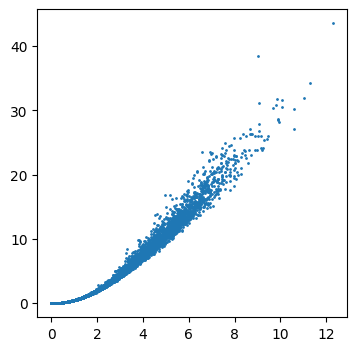

In [627]:
plt.scatter(torch.norm(params, dim=1), targets, s=1)

Really, it's a question of achieving 'good enough' performance

#### Overall summary:
It is probably possible to develop a method that finds the right parameter range for any dataset (eg by evaluating Jacobians of the eCGF).
For now, however, we will instead simply whiten the input data, and use a fixed value of the variance.



# Trial run 1: Margnial MNIST

## MNIST setup:

In [2]:
%run icnn.py
%run models/simple_examples.py
%run trainers.py

In [3]:
mnist_model = Basic_MNIST()
ckpt = train_model(mnist_model, None)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type             | Params | Mode 
----------------------------------------------------
0 | model  | Sequential       | 22.3 K | train
1 | lossFn | CrossEntropyLoss | 0      | train
----------------------------------------------------
22.3 K    Trainable params
0         Non-trainable params
22.3 K    Total params
0.089     Total estimated model params size (MB)
5         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Train Loss,█▄▅▂▂▁▁▂▂▁▁▁▁▁▁▁▂▁▁▁▁▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▆▄▃▂▁▂▁▁▁▁▁▁▁▁▂▂▂▂▂▃▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅
Val acc,▁▃▄▆▇▇▇█▇▇█▇████████▇██▇████████▇▇██▇██▇
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇████
Train Loss,0.017
Val Loss,0.1999
Val acc,0.95933
epoch,48
trainer/global_step,82711


In [3]:
ckpt ='./learnedExpFam/4ttqob80/checkpoints/epoch=48-step=82712.ckpt'

In [4]:
mnist_model = Basic_MNIST.load_from_checkpoint(ckpt)
mnist_model.setup()
activity_data = mnist_model.internal_activity_dataset(mnist_model.data_train)

In [210]:
from sklearn.manifold import TSNE
tsne = TSNE(2)

dim_reduced = tsne.fit_transform(mnist_cgf.data)

In [211]:
dim_reduced.shape

(54000, 2)

In [218]:
dl = DataLoader(mnist_model.data_train, batch_size=len(mnist_model.data_train))
inputs, targets = next(iter(dl))

Text(0.5, 1.0, 'MNIST data, dimensionality reduction')

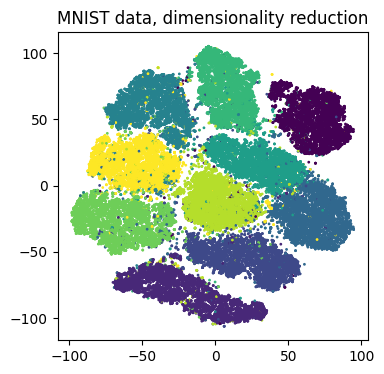

In [222]:
plt.scatter(dim_reduced[:,0], dim_reduced[:,1], c=targets, s=1)
plt.title('MNIST data, dimensionality reduction')

## With MNIST data

Transform: remove mean of all data, divide by variance of all data.

I hope that this transform with preserve the features of the data while remaining fittable with the small varaince that we are putting in.

In [5]:
%run icnn.py

In [6]:
mnist_cgf = CGF_ICNN(activity_data[:][0],  numsamples=int(1E6))
train_model(mnist_cgf, 'trainedParameters/MNIST_initial/step1_MNIST')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step1_MNIST exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 86.4 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
86.4 K    Trainable params
0         Non-trainable params
86.4 K    Total params
0.346     Total estimated model p

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Train Loss,▆▄▄▆▅█▃▅▅▁▂▅▃▃▃▂▆▄▂▅▃▅▁▂▂▅▃▁▃▂▂▃▂▃▁▁▂▄▂▁
Val Loss,█▇▇▄▅▄▃▂▃▃▃▂▃▂▃▃▃▂▂▁▂▁▂▂▂▁▂▁▁▁▁▂▁▄▂▁▁▁▂▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
trainer/global_step,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
Train Loss,0.0216
Val Loss,0.03808
epoch,410
trainer/global_step,3050441


'/Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step1_MNIST/validation-epoch=310-step=2308242.ckpt'

Starting error: reasonably small, by not excellent ~0.1, learns well ~0.04. Good enough!

The main question is what it looses by the focus on small theta values.

Note that the train and validation sets are different from the ones that were actually used because I reloaded the model

### In distribution performance

In [9]:
ckpt = 'trainedParameters/MNIST_initial/step1_MNIST/validation-epoch=310-step=2308242.ckpt'
mnist_cgf = CGF_ICNN.load_from_checkpoint(ckpt, data_to_model=activity_data[:][0])
mnist_cgf.setup()

In [242]:
val_data, targets = mnist_cgf.val_split[:]
targets = targets.squeeze()
outputs = mnist_cgf.fwd_cpu(val_data).squeeze().detach()

In [243]:
norms = torch.norm(val_data, dim=1)

Text(0, 0.5, 'error')

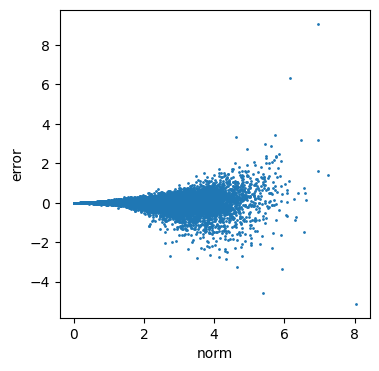

In [247]:
figsize(4,4)
plt.scatter(norms, outputs-targets, s=1)
plt.xlabel('norm')
plt.ylabel('error')

Text(0, 0.5, 'error')

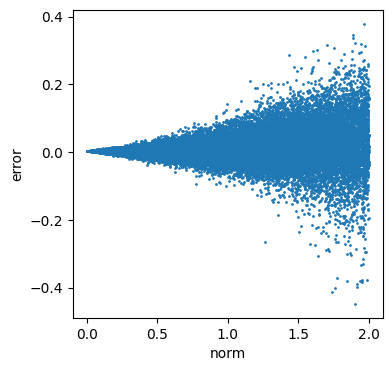

In [248]:
figsize(4,4)
plt.scatter(norms[norms <2], (outputs-targets)[norms <2], s=1)
plt.xlabel('norm')
plt.ylabel('error')

In [249]:
torch.abs(outputs-targets).mean()

tensor(0.0763)

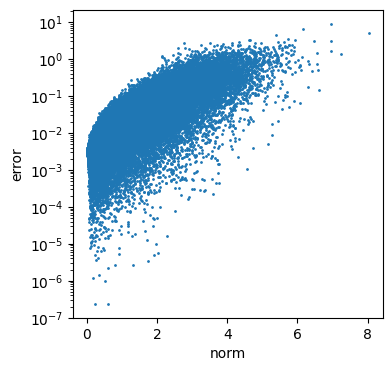

In [250]:
figsize(4,4)
plt.scatter(norms, torch.abs(outputs-targets), s=1)
plt.xlabel('norm')
plt.ylabel('error')

plt.yscale('log')

/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'c'
  cset = contour_func(


<Axes: xlabel='norm', ylabel='log error'>

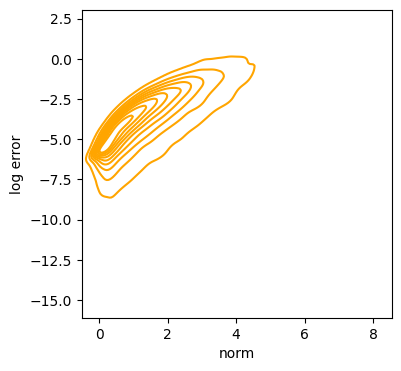

In [264]:
sns.kdeplot(data=pd.DataFrame({'norm': norms, 'log error': torch.log(torch.abs(outputs-targets))}),
            x="norm", y="log error", c='orange')

Note: there are a lot of datapoints. The error might look large, but there is a very large density of very small errors as well.
The KDE plot cuts through this, and shows a strong correlation between norm and error, as we expect

In [88]:
Hs = mnist_cgf.hess(val_data)

Text(0, 0.5, 'Hessian determinant')

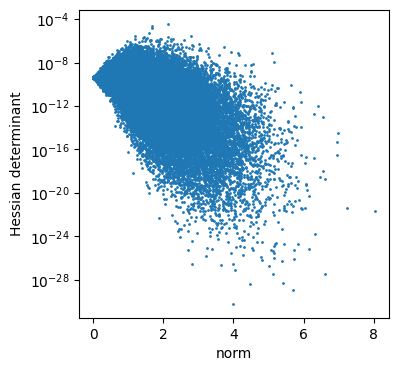

In [90]:
plt.scatter(norms, torch.det(Hs).detach(), s=1)
plt.yscale('log')
plt.xlabel('norm')
plt.ylabel('Hessian determinant')

The 'fan out' from zero is interesting on first glance, but I think is actually totally expected: it is the result of heterogenity in the ground truth hessians as the 

Text(0, 0.5, 'Error magnitude')

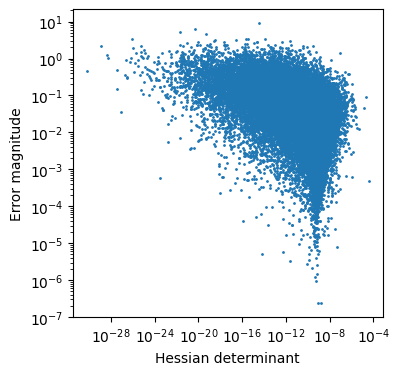

In [95]:
plt.scatter(torch.det(Hs).detach(), torch.abs(outputs-targets), s=1)
plt.xscale('log')
plt.yscale('log')

plt.xlabel('Hessian determinant')
plt.ylabel('Error magnitude')

Text(0, 0.5, 'Error magnitude')

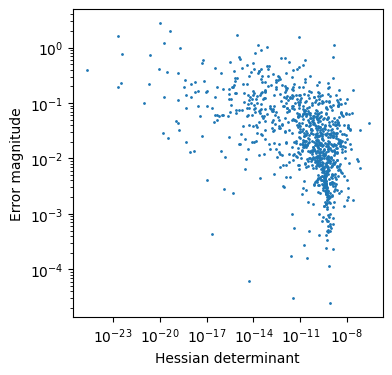

In [100]:
plt.scatter(torch.det(Hs).detach()[0:1000], torch.abs(outputs-targets)[0:1000], s=1)
plt.xscale('log')
plt.yscale('log')

plt.xlabel('Hessian determinant')
plt.ylabel('Error magnitude')

Huh. The Hessian determinants are small everywhere.... Why would that be the case?

Hard to say what the relationship is between the size of the Hessian determinant and the error magnitude, but it looks to be at least grossly as expected: larger determinant, lower error.

In [103]:
mnist_cgf.empirical_CGF(torch.zeros([1, 28]))

tensor([0.])

In [104]:
mnist_cgf.fwd_cpu(torch.zeros([1, 28]))

tensor([[0.0032]], grad_fn=<ToCopyBackward0>)

In [108]:
mnist_cgf.jac(torch.zeros([1, 28]))

tensor([[ 0.1431,  0.2250,  0.3940, -0.4558, -0.1834, -0.1728,  0.5122, -0.1141,
          0.1121,  0.1467, -0.4697,  1.0915, -0.4034,  0.1257, -0.3257, -0.0699,
         -0.2306,  0.1553, -0.3686, -0.4012,  0.3521, -0.3497, -0.1949,  0.2725,
         -0.4368, -0.4405,  0.3809,  0.4508]], grad_fn=<SliceBackward0>)

Text(0.5, 1.0, 'mean values')

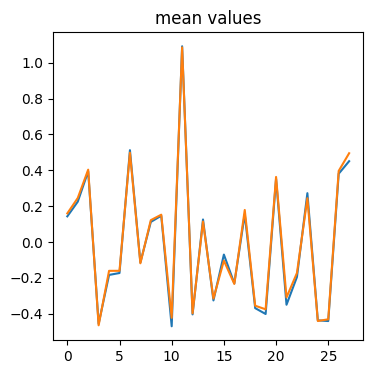

In [160]:
plt.plot(mnist_cgf.jac(torch.zeros([1, 28])).detach().squeeze())
plt.plot(mnist_cgf.data.mean(0))
plt.title('mean values')

The network does capture the mean well

In [114]:
cov_fit = mnist_cgf.hess(torch.zeros([1, 28]))

In [171]:
cov_data = mnist_cgf.data.T.cov()

Text(0.5, 1.0, 'Cov difference')

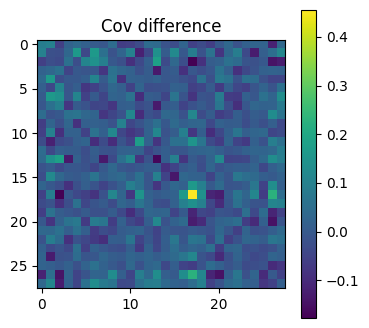

In [172]:
plt.imshow(cov_fit[0].detach() - cov_data)
plt.colorbar()

plt.title('Cov difference')

Text(0.5, 1.0, 'Cov eignevalues')

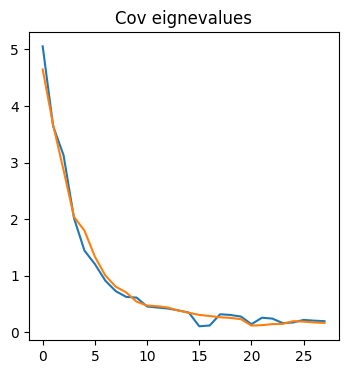

In [173]:
plt.plot(torch.linalg.eigvals(cov_fit[0]).detach().real)
plt.plot(torch.linalg.eigvals(cov_data).detach().real)

plt.title('Cov eignevalues')

Text(0.5, 1.0, 'Cov eigenvector 1')

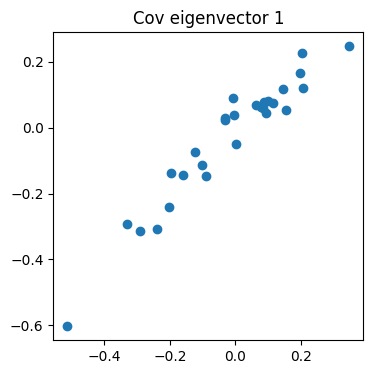

In [174]:
plt.scatter(torch.linalg.eig(cov_data).eigenvectors[:,0].detach(),
         torch.linalg.eig(cov_fit[0]).eigenvectors[:,0].detach()
        )

plt.title('Cov eigenvector 1')

Text(0.5, 1.0, 'Cov eigenvector 2')

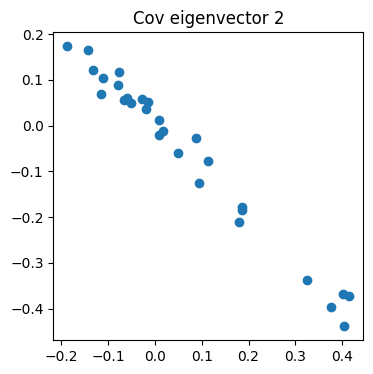

In [175]:
plt.scatter(torch.linalg.eig(cov_data).eigenvectors[:,1].detach(),
         torch.linalg.eig(cov_fit[0]).eigenvectors[:,1].detach()
        )

plt.title('Cov eigenvector 2')

The learned CGF captures the covariance matrix fairly well too.

Text(0.5, 1.0, 'Cov eigenvectors')

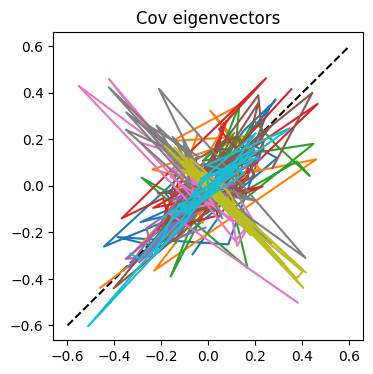

In [204]:
xs = np.linspace(-0.6, 0.6)
plt.plot(xs, xs, '--k')
for i in range(10)[::-1]:
    plt.plot(torch.linalg.eig(cov_data).eigenvectors[:,i].detach().real,
             torch.linalg.eig(cov_fit[0]).eigenvectors[:,i].detach().real,
            )
    
plt.title('Cov eigenvectors')

Eigenvectors do breakdow at smaller eigenvalues, but they are quite good intially. Not terribly surprising given the small contribution of these dimensions

Ok. By simple metrics, the CGF network appears to be performing quite well.

The question is how this works underbetter metrics, in particular, in practice.

### Generalization performance

In [273]:
thetas_gen = normal_radius_uniform_angle(28, 5.).rvs(20000)
norms_gen = torch.norm(thetas_gen, dim=1)

targets_gen = mnist_cgf.empirical_CGF(thetas_gen)
outputs_gen = mnist_cgf.fwd_cpu(thetas_gen).squeeze().detach()

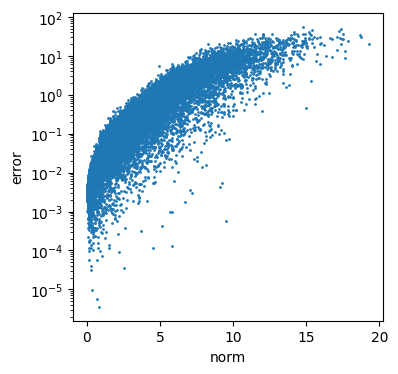

In [285]:
figsize(4,4)
plt.scatter(norms_gen, outputs_gen-targets_gen, s=1)
plt.xlabel('norm')
plt.ylabel('error')
plt.yscale('log')

Text(0, 0.5, 'output')

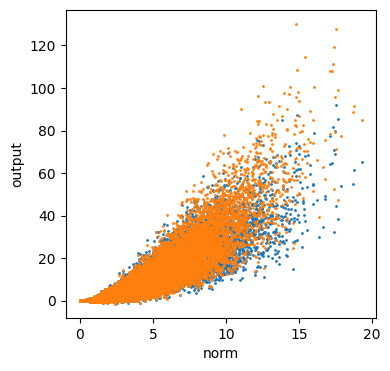

In [284]:
plt.scatter(norms_gen, targets_gen, s=1)
plt.scatter(norms_gen, outputs_gen, s=1)
plt.xlabel('norm')
plt.ylabel('output')

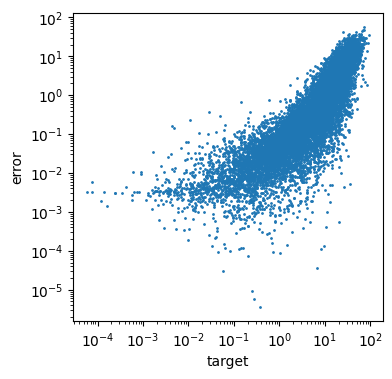

In [287]:
figsize(4,4)
plt.scatter(targets_gen, outputs_gen-targets_gen, s=1)
plt.xlabel('target')
plt.ylabel('error')
plt.yscale('log')
plt.xscale('log')

This really show the generalization breakdown: there is a different slope in the log-log plot as targets pass ~10


/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'c'
  cset = contour_func(


<Axes: xlabel='norm', ylabel='log error'>

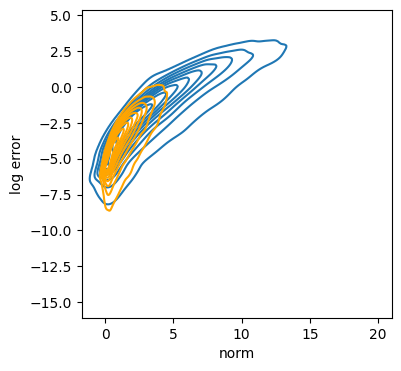

In [278]:
sns.kdeplot(data=pd.DataFrame({'norm': norms_gen, 'log error': torch.log(torch.abs(outputs_gen-targets_gen))}),
            x="norm", y="log error")
sns.kdeplot(data=pd.DataFrame({'norm': norms, 'log error': torch.log(torch.abs(outputs-targets))}),
            x="norm", y="log error", c='orange')

It does break-down fairly significantly outside of the domain of interest.

I was hoping that the 'simple' linear extrapolation would mean that generalization performance outside of the training domain would be resonable, but that proved not to be the case.
In high dimensions, maybe the linear extrapolation is not really that easy after all....

The question here is: does this generalization error actually matter?
If so, we can look for better training, sampling approaches, but that is not the most important thing right now.

# Trial run 2: MNIST Conditional CGF

## Step 1: repeat the previous conditional CGF results

I've done a bit of coding since I last looked into this.

In [5]:
%run cgf_network.py

<Figure size 400x400 with 0 Axes>

In [2]:
def mean(ss, radius=5.):
    return radius*torch.stack([torch.cos(ss), torch.sin(ss)]).T

def root_cov(ss):
    # scale the white noise, then rotate
    scale = torch.diag(torch.tensor([0.5,0.1]))

    first_col = torch.stack([torch.cos(ss), torch.sin(ss)])
    second_col = torch.stack([-torch.sin(ss), torch.cos(ss)])
    rotations = torch.stack([first_col, second_col])
    covs = torch.permute(rotations, (2,1,0) ) @ scale
    return covs
    

def heterogeneous_normal(ss, n=10, radius=5):
    cov_mat = root_cov(ss)
    means = torch.permute(mean(ss, radius=radius).repeat((n,1,1)), (1,0,2))
    
    white_noise = torch.randn(ss.shape[0], n, 2)

    noise = torch.einsum('Smk, SNk -> SNm', cov_mat, white_noise)

    return means, means + noise

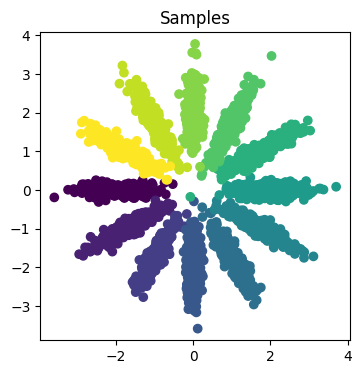

In [3]:
n = 300
ss = torch.linspace(-torch.pi, torch.pi, 13)[0:-1]

means, samples = heterogeneous_normal(ss, n, radius=2)
data = samples.reshape(-1,2)

all_s = ss.repeat(n, 1).T.reshape(-1)
figsize(4,4)
plt.scatter(data[:, 0], data[:, 1], c=all_s)
plt.title('Samples')
_=plt.axis('equal')

### Debug:

In [6]:
dataset = TensorDataset(data, all_s[:,None])
conditional_model = ConditionalCGF(dataset, parameter_radius=15)


In [303]:
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model params size (MB)
9         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                          | …

Training: |                                                                                                 | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                               | …

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Not what we're looking for. Single digits in the validation error...

The previous success used `parameter_radius=12` and `variance=2`

In [304]:
dataset = TensorDataset(data, all_s[:,None])
conditional_model = ConditionalCGF(dataset, parameter_radius=12, variance=2)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

Train Loss,▄▁▄▄▄▅█▅▅▄▄▇▆▅▇▄▆▅▆▃█▃▄▃▄▅▅▄▄▂▄▁▅▃▅▄▇▂▄▅
Val Loss,█▆▅▄▄▄▄▄▃▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
trainer/global_step,▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███
Train Loss,2.01619
Val Loss,2.49397
epoch,144
trainer/global_step,217379


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

A bit better, but still not there yet. Odd, since this should be the same as out previous success. Lets try using exactly that version.

In [305]:
from icnn_target import CGF_target

In [306]:
dataset = TensorDataset(data, all_s[:,None])
model = CGF_target(dataset, parameter_radius=12, variance=2)

train_model(model, 'trainedParameters/MNIST_initial/step2_initial/', max_epochs=5000)

Train Loss,▃▅▂▃▃▄▃▁▃▃▃▁▂▁▃█▃▂▃▁▂▁▃▂▃▆▄▂▄▂▃▃▄▂▃▂▂▃▂▁
Val Loss,█▅▅▅▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▂▂▁▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇▇▇███
Train Loss,1.9388
Val Loss,1.6485
epoch,148
trainer/global_step,223499


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.
/Users/luke/Documents/activeProjects/learnedExpFam/icnn_target.py:160: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to rever

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [391]:
old_model = model

Yep, this one replicates just fine. Phew.

What is the difference? Number of samples? Multivariate sampling? Is the variance incorrectly written?

In [8]:
# imitating sampling for the successful case

from scipy.stats import multivariate_normal

class mv_sampler(object):
    def __init__(self, n_dims, variance):
        self.dist=multivariate_normal(np.zeros(n_dims), variance*np.eye(n_dims))
    def rvs(self, N):
        return torch.tensor(self.dist.rvs(N), dtype=torch.float32)

In [357]:
np.cov(mv_sampler(2, 2**0.5).rvs(10000).T)

array([[ 1.41344278, -0.03564233],
       [-0.03564233,  1.4116863 ]])

The variance is incorrectly written.

In [358]:
conditional_model = ConditionalCGF(dataset, sample_theta=mv_sampler, parameter_radius=12, variance=4, numsamples=2000)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

Train Loss,▇▅▅▇▅▃▂▅▁▇▇▅▆▅▅▆▅▇█▅▃▆▆▃▅▅▄▇▆▇▇▃▄▃▅▇▆█▃▅
Val Loss,██▆▆▆▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
trainer/global_step,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇█
Train Loss,2.19626
Val Loss,2.49969
epoch,247
trainer/global_step,37079


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Still no joy. Also stuck at higher ~2 validation error.

In [365]:
old_samples = model.sample_dual_training(model.dataset[:][0])

In [366]:
old_samples.T.cov()

tensor([[ 1.9454, -0.0620],
        [-0.0620,  2.0144]])

In [367]:
new_samples = conditional_model.sample_dual_training()

In [368]:
new_samples.T.cov()

tensor([[1.9263, 0.0237],
        [0.0237, 2.0254]])

In [373]:
old_samples.mean(0)

tensor([-8.9950e-03, -8.7766e-05])

In [374]:
new_samples.shape

torch.Size([2000, 2])

In [375]:
old_samples.shape

torch.Size([2000, 2])

I wasn't rounding the targets properly

In [398]:
%run cgf_network

In [379]:
conditional_model = ConditionalCGF(dataset, sample_theta=mv_sampler, parameter_radius=12, variance=4, numsamples=2000)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Still no.

What if I train with the data from the previous model? Note: requires checking if train_split exists at the beginning of setup

In [9]:
conditional_model = ConditionalCGF(dataset, sample_theta=mv_sampler, parameter_radius=12, variance=4, numsamples=2000)
conditional_model.train_split = old_model.train_split
conditional_model.val_split = old_model.val_split

NameError: name 'old_model' is not defined

^^had to restart the kernel and accidentally reran this cell

In [406]:
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Bang. It's going now. Something is wrong in the way the data is generated.

In [12]:
%run cgf_network.py
%run trainers.py

In [13]:
conditional_model = ConditionalCGF(dataset, sample_theta=mv_sampler, parameter_radius=12, variance=4, numsamples=2000)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.
/Users/luke/Documents/activeProjects/learnedExpFam/cgf_network.py:257: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to rever

tensor([[-3.1416],
        [-2.6180],
        [-2.0944],
        [-1.5708],
        [-1.0472],
        [-0.5236],
        [ 0.0000],
        [ 0.5236],
        [ 1.0472],
        [ 1.5708],
        [ 2.0944],
        [ 2.6180]])


Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Ok, it was my updates to the targets that was causing a problem. Need to reimplement this after I'm done here.

Interesting that this one learned way quicker than even the previous one. 

In [14]:
conditional_model = ConditionalCGF(dataset, parameter_radius=12)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_initial')

Train Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
trainer/global_step,▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
Train Loss,0.01898
Val Loss,0.02375
epoch,81
trainer/global_step,12209


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_initial exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated model

tensor([[-3.1416],
        [-2.6180],
        [-2.0944],
        [-1.5708],
        [-1.0472],
        [-0.5236],
        [ 0.0000],
        [ 0.5236],
        [ 1.0472],
        [ 1.5708],
        [ 2.0944],
        [ 2.6180]])


Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Ok great. Now its working well.

The problem was that I forgot about the fact that I had changed the target to parameter mapping, trying to generalize it, which I still have to do.

### examples, generalization

#### Parameter embedding

In [95]:
def n_orthogonal_directions(n, dim):
    """ Find n directions in dim dimensions That are close to orthogonal to each other.
    """
    def to_minimize(x):
        x_normalized = x / torch.norm(x, dim=1 )[:, None]
        return torch.abs( x_normalized @ x_normalized.T).sum() - n
    
    points = torch.randn(n, dim)
    points = points / points.norm()
    points = Parameter(points)
    
    optimizer = torch.optim.SGD((points,), lr=1E-3)
    for step in range(200):
        curr_val = optimizer.param_groups[0]['params'][0]
        optimizer.zero_grad()
            
        out = to_minimize(curr_val)
        out.backward()
        optimizer.step()

    outs = optimizer.param_groups[0]['params'][0]
    return (outs / torch.norm(outs, dim=1)[:, None]).detach()
    

In [96]:
points = n_orthogonal_directions(10, 20)

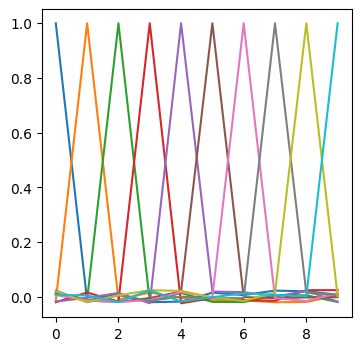

In [99]:
for i in range(10):
    plt.plot((points @ points.T)[i])

This looks pretty damn good.

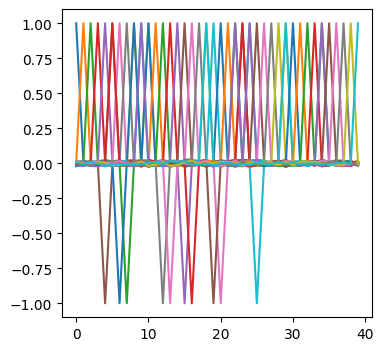

In [100]:
points = n_orthogonal_directions(40, 30)
for i in range(40):
    plt.plot((points @ points.T)[i].detach())

In [101]:
(points @ points.T).min()

tensor(-0.9996)

In [102]:
for i in range(40):
    print(i, (points @ points.T)[i].min())

0 tensor(-0.0209)
1 tensor(-0.0184)
2 tensor(-0.0189)
3 tensor(-0.0214)
4 tensor(-0.9996)
5 tensor(-0.0224)
6 tensor(-0.9993)
7 tensor(-0.9995)
8 tensor(-0.0232)
9 tensor(-0.0248)
10 tensor(-0.0256)
11 tensor(-0.0204)
12 tensor(-0.9995)
13 tensor(-0.9996)
14 tensor(-0.0175)
15 tensor(-0.9996)
16 tensor(-0.9996)
17 tensor(-0.0133)
18 tensor(-0.0250)
19 tensor(-0.9994)
20 tensor(-0.9993)
21 tensor(-0.0191)
22 tensor(-0.0232)
23 tensor(-0.0223)
24 tensor(-0.0255)
25 tensor(-0.9994)
26 tensor(-0.0201)
27 tensor(-0.0193)
28 tensor(-0.0203)
29 tensor(-0.0255)
30 tensor(-0.0175)
31 tensor(-0.0179)
32 tensor(-0.0198)
33 tensor(-0.0203)
34 tensor(-0.0228)
35 tensor(-0.0207)
36 tensor(-0.0175)
37 tensor(-0.0208)
38 tensor(-0.0185)
39 tensor(-0.0183)


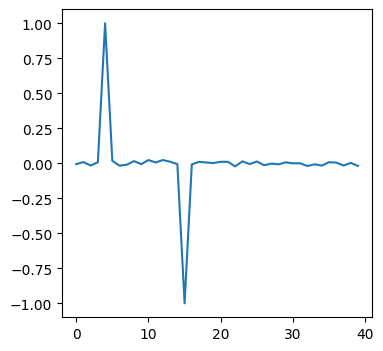

In [103]:
plt.plot((points @ points.T)[4].detach())

In [104]:
points = n_orthogonal_directions(10, 2)

We can't get more orthogonal points than there are dimensions.. This sparse objective selects for points that are opposite of each other. Resaonable.

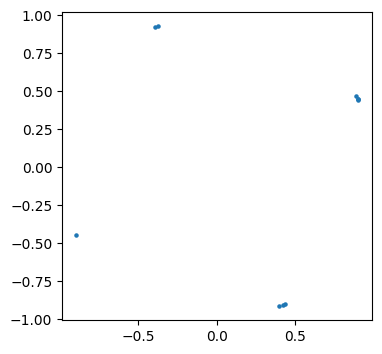

In [109]:
plt.scatter(points[:,0], points[:,1], s=5)

Two dimensions doesn't give what we want, which is uniformly spaced outputs. Maybe we have to minimize distances instead.

In [202]:
def n_distant_points(n, dim):
    """ find n points on a dim dimensional sphere that are as far
        from each other as possible
    """
    def to_maximize(x):
        x_normalized = x / torch.norm(x, dim=1 )[:, None]
        return torch.cdist(x_normalized, x_normalized, p=2).sum() / 2
    
    points = torch.randn(n, dim)
    points = points / points.norm()
    points = Parameter(points)
    
    optimizer = torch.optim.Adam((points,), lr=1E0, maximize=True)
    for step in range(200):
        curr_val = optimizer.param_groups[0]['params'][0]
        optimizer.zero_grad()
            
        out = to_maximize(curr_val)
        out.backward()
        optimizer.step()

    outs = optimizer.param_groups[0]['params'][0]
    return (outs / torch.norm(outs, dim=1)[:, None]).detach()
    

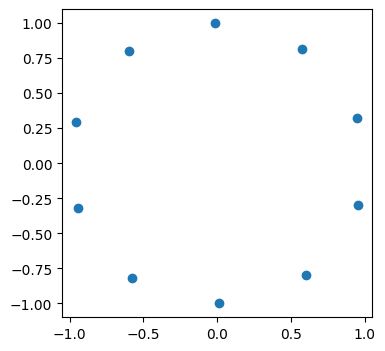

In [219]:
points = n_distant_points(10, 2)
plt.scatter(points[:,0], points[:,1])

Interesting: the optimization seems to struggle to converge when $p=1$, even with only 2 dimension.
With $p=2$, the generated points look great actually.

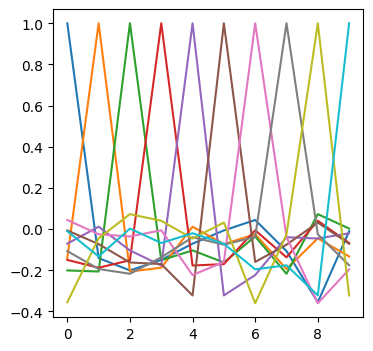

In [205]:
points = n_distant_points(10, 20)

for i in range(10):
    plt.plot((points @ points.T)[i].detach())

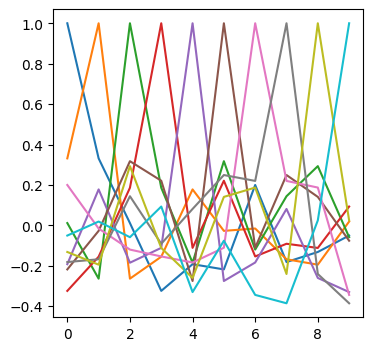

In [216]:
points = torch.randn(10, 20)
points = points / torch.norm(points, dim=1)[:,None]
for i in range(10):
    plt.plot((points @ points.T)[i].detach())

In terms of orthogonality, the minimum distance results with `n < dim` are not as good as orthogonal results, but are somewhat better than random.

#### New parameter embedding

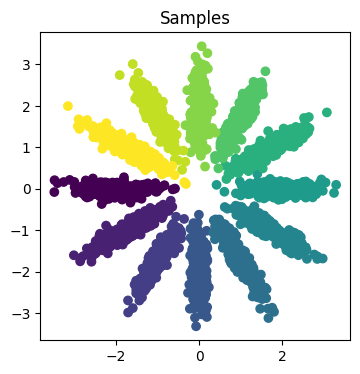

In [8]:
n = 300
ss = torch.linspace(-torch.pi, torch.pi, 13)[0:-1]
target_ind = torch.arange(ss.shape[0])

means, samples = heterogeneous_normal(ss, n, radius=2)
data = samples.reshape(-1,2)

all_s = ss.repeat(n, 1).T.reshape(-1)
targets = target_ind.repeat(n, 1).T.reshape(-1)

figsize(4,4)
plt.scatter(data[:, 0], data[:, 1], c=all_s)
plt.title('Samples')
_=plt.axis('equal')

In [9]:
(ss[ targets] == all_s).all()

tensor(True)

targets gives the index of the `s` value

In [11]:
dataset = torch.utils.data.TensorDataset(data, targets[:,None])

In [34]:
%run cgf_network.py
%run trainers.py

<Figure size 400x400 with 0 Axes>

In [35]:
conditional_model = ConditionalCGF(dataset, parameter_radius=12)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_newparameters')

Train Loss,▄▅▃▅▄▅▆▄▄▄▄▅▄▄▂▇▆█▂▅▅▃▅▆▂▇▃▂▄▁▅▆▄▅▁▄▃▇▃▅
Val Loss,█▇▆▅▄▄▃▂▁▁
epoch,▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇████
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇█████
Train Loss,3.37071
Val Loss,2.63009
epoch,10
trainer/global_step,15269


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_newparameters exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [17]:
conditional_model.parameter_angles

tensor([[-0.6434,  0.7655],
        [ 0.3413,  0.9400],
        [-0.7655, -0.6434],
        [ 0.9400, -0.3413],
        [-0.9847, -0.1744],
        [-0.9400,  0.3413],
        [ 0.1744, -0.9847],
        [-0.3413, -0.9400],
        [ 0.7655,  0.6434],
        [ 0.6434, -0.7655],
        [-0.1744,  0.9847],
        [ 0.9847,  0.1744]])

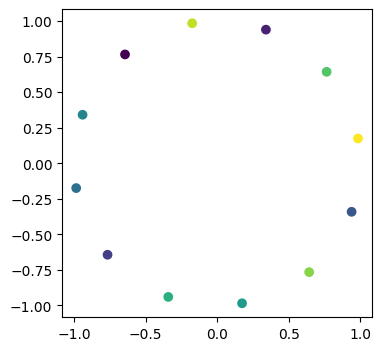

In [22]:
plt.scatter(conditional_model.parameter_angles[:, 0], conditional_model.parameter_angles[:,1], c=range(12))

In [23]:
%run icnn_target.py

<Figure size 400x400 with 0 Axes>

In [24]:
old_version = CGF_target(dataset)

In [30]:
params = old_version.make_parameters( ss)

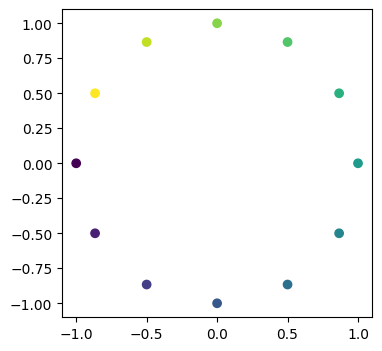

In [31]:
plt.scatter(params[:, 0], params[:,1], c=range(12))

Very interesting. From running the model, it appears that the _arrangement_ of the parameter is critical to the method working well.

This is interesting from the perspective of learning parameter curves. Annoying from the perspective of getting the thing to work well... in a simple manner

In [49]:
%run cgf_network.py

In [ ]:
conditional_model = ConditionalCGF(dataset, parameter_radius=12)
train_model(conditional_model, 'trainedParameters/MNIST_initial/step2_newparameters')

Train Loss,▅▇▂▂▅▃▃▂▆▂▄▃▂▃▃▃▆▃▅▁▄▆▂▄▄▃▁█▂▅▅▂▄▁▇▃▅▄▂▆
Val Loss,█▆▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██
Train Loss,1.63766
Val Loss,2.46796
epoch,44
trainer/global_step,66449


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/loggers/wandb.py:396: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
/Users/luke/.local/defaultPythonEnv/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/luke/Documents/activeProjects/learnedExpFam/trainedParameters/MNIST_initial/step2_newparameters exists and is not empty.

  | Name   | Type       | Params | Mode 
----------------------------------------------
0 | model  | Sequential | 81.2 K | train
1 | lossFn | MSELoss    | 0      | train
----------------------------------------------
81.2 K    Trainable params
0         Non-trainable params
81.2 K    Total params
0.325     Total estimated

Sanity Checking: |                                                                                  | 0/? [00:…

Training: |                                                                                         | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                     | 0/? [00:00…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

Validation: |                                                                                       | 0/? [00:…

In fact, simply reversing the hardcoded values is sufficient to destroy the performance.